#### Computer Vision - 2020 - 2021

**Lecturer:** Prof Yael Moses, IDC

**TA:** Eyal Friedman, IDC

# Computer vision project - Segmentation
### By: Gil Zeevi

In this project i will demonstrate several methods for image segmentation that was presented to us.
my goal is to implement each method by myself, and then possibly, add some nice adjustments to it to try to improve it.
the evaluation method will be **F - score** measurement which uses precision and recall, as follows: $$P = \frac{| E \cap GT\ | }{ |E|\ }, R = \frac{| E \cap GT\ | }{ |GT|\ } ,\\ \large F_{score} = 2\frac{PR}{P+R}$$
I will use 10 sample images from The Weizmann Horse Database which contains 328 side-view color images of horses that were also manually segmented for ground truth evaluations. the credit goes to Eran Borenstein and his site:
https://www.msri.org/people/members/eranb/

In [1]:
import seaborn as sns
import cv2
import matplotlib
import warnings
import matplotlib.pyplot as plt
import numpy as np
from scipy.linalg import eigh
np.set_printoptions(suppress=True) # suppresses the use of scientific notation for small numbers
# This specifies the way plots behave in jupyter notebook
%matplotlib inline
plt.rcParams['image.cmap'] = 'gray'
warnings.filterwarnings("ignore")
from scipy import optimize,signal
from PIL import Image
from skimage.feature import peak_local_max
from tqdm.notebook import tqdm
import pandas as pd
from IPython.display import display_html
def restartkernel():
    display_html("<script>Jupyter.notebook.kernel.restart()</script>",raw=True)

In [2]:
def f_evaluataion(img, GT): # enter two thresholded gray images
    img[img > 0] = 1  # binary map of image
    GT[GT > 0] = 1  # binary map of GT
    e_gt = np.sum(img + GT == 2)
    e = np.sum(img)
    gt = np.sum(GT)
    if e == 0:
        return 0
    p = round(e_gt / e, 3)
    r = round(e_gt / gt, 3)
    f = round(2 * p * r / (p + r), 3)
#     return p, r, f
    if np.isnan(f):
        return 0
    return f

In [3]:
def img_Resize(path,size): #accepts path! not image
    im = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    im = cv2.resize(im, size, interpolation = cv2.INTER_AREA)
    return im

In [4]:
#GET ONLY 10 SAMPLES OF DATASET
horses= []
GT = []
for i in range(10):
    if i < 9:
        horses.append("horse00" + str(i+1) +".jpg")
        continue
    if i < 99:
        horses.append("horse0" + str(i+1) + ".jpg")
        continue
    horses.append("horse" + str(i+1) + ".jpg")

for i in range(10):
    GT.append("gt" + str(i + 1) + ".jpg")

## 1) Global thresholding

First when approaching segmentations, i want to ask myself, which one is the simplest method, and what results does it produce?
Well, of course the most intuitive method will be thresholds. a method which partitions the pixels depending on their intensity value. but just picking thresholds by random, or "hunch", isnt enough. in order to reach an optimal threshold, one might look on the vallys of the image histogram,
i will present a way that reminds somewhat of the numerical method bisection, to find a root of a function. this method is pretty simple, and goes as follows:
* start with an arbitrary threshold or smart initial guess, such as $T =$ the image intensity's mean, $\mu$
* divide Image into 2 partitions using the initial threshold
* calculate mean intensity of each partition
* $\large T_{new} = \frac{\mu_1 + \mu_2}{2}$

In [5]:
def th_global(img):
    t = img.mean() #Image's mean intensity
    t_new = 1
    flag = 1
    while np.abs(t-t_new) >0.5:
            if flag ==0: # skip the first iteration
                t = t_new
            g1 = img[img>t]
            g2 = img[img <= t]
            m1 = g1.mean()
            m2 = g2.mean()
            t_new = (m1+m2)*0.5
            flag = 0
    return t_new

In [6]:
def plot_img_global_th(img_name,GT):
    img = cv2.imread(img_name, cv2.IMREAD_GRAYSCALE)
    img = cv2.GaussianBlur(img,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
    gt = img_Resize(GT,(img.shape[1],img.shape[0]))
    ret,thresh1 = cv2.threshold(img,th_global(img),255,cv2.THRESH_BINARY_INV)
    f = f_evaluataion(thresh1, gt)
    fig, ((ax1, ax2, ax3)) = plt.subplots(3, 1,figsize=(8,12))
    ax1.imshow(img, cmap='gray'); ax1.set_title('Original Image')
    ax2.hist(img.ravel(),256,[0,256]), ax2.set_title('Img Histogram')
    ax2.axvline(th_global(img),color='g',linestyle="dashed", alpha = 0.5, label = "Calc Threshold: {:.0f}".format(th_global(img)))
    ax2.legend()
    ax3.imshow(thresh1, cmap='gray'), ax3.set_title('Applying Global Threshold')
    ax3.set_xlabel("*** F_score={:0.3f} ***".format(f),fontsize=20)
    plt.show()
    return f

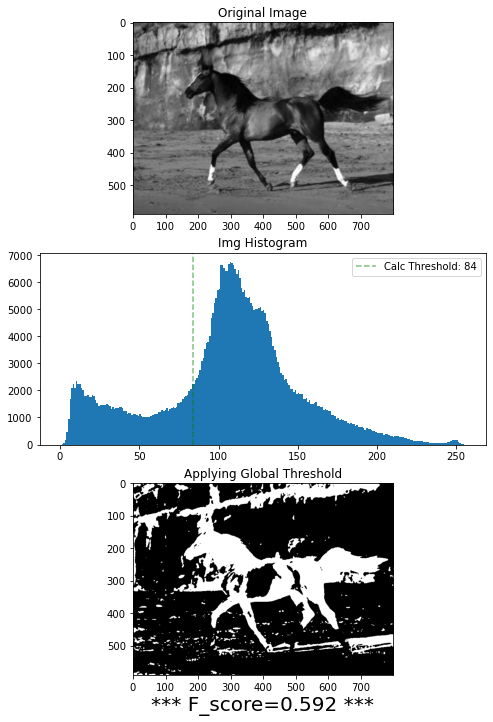

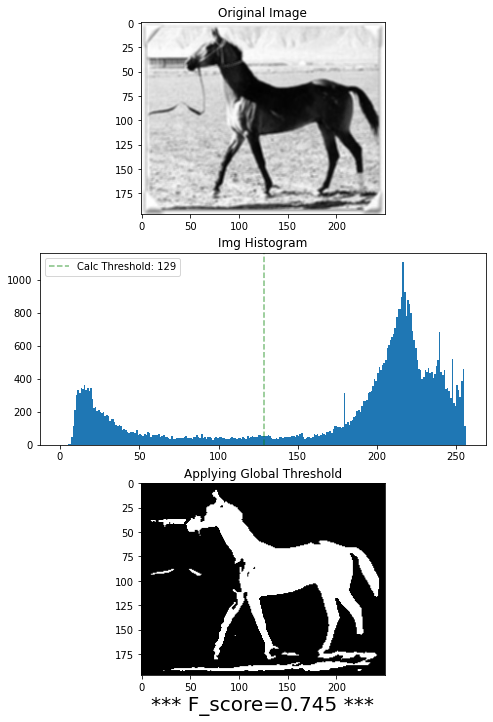

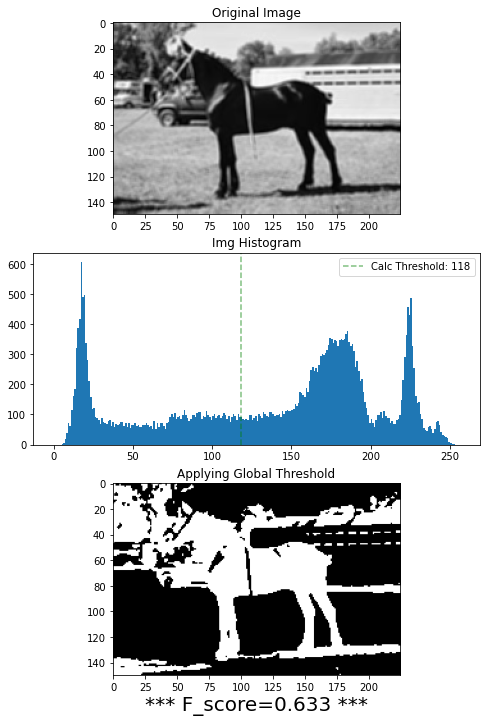

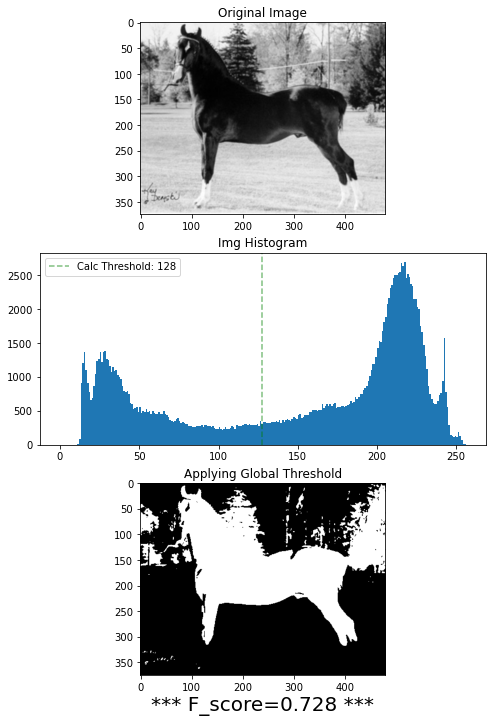

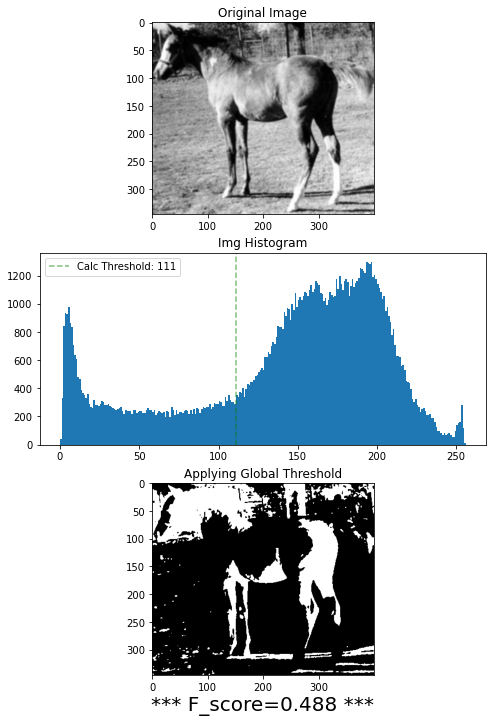

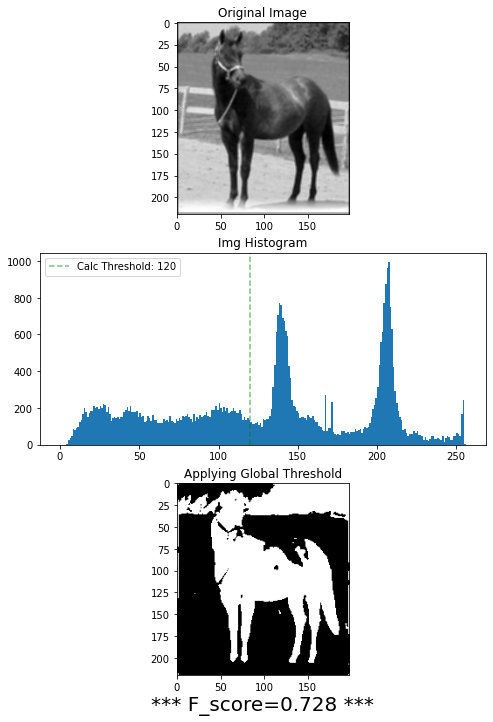

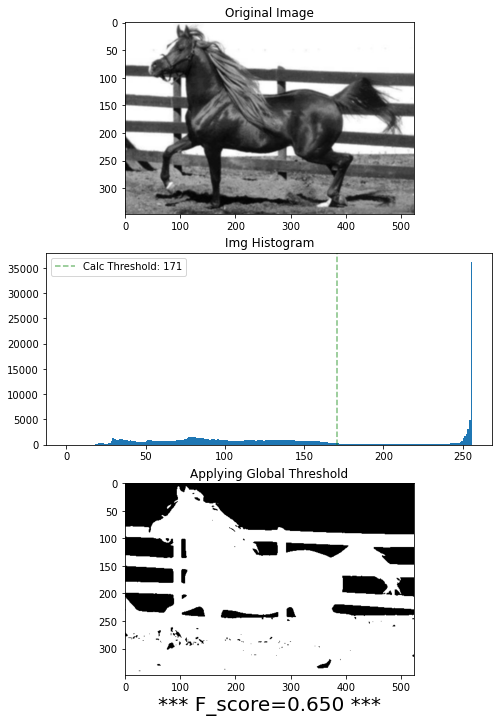

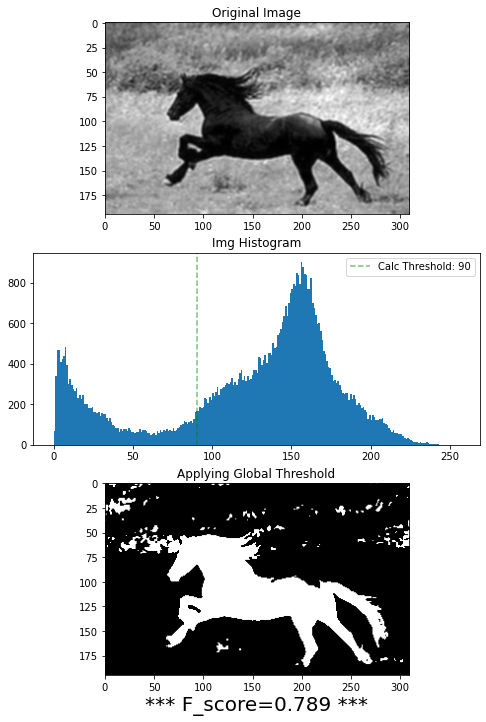

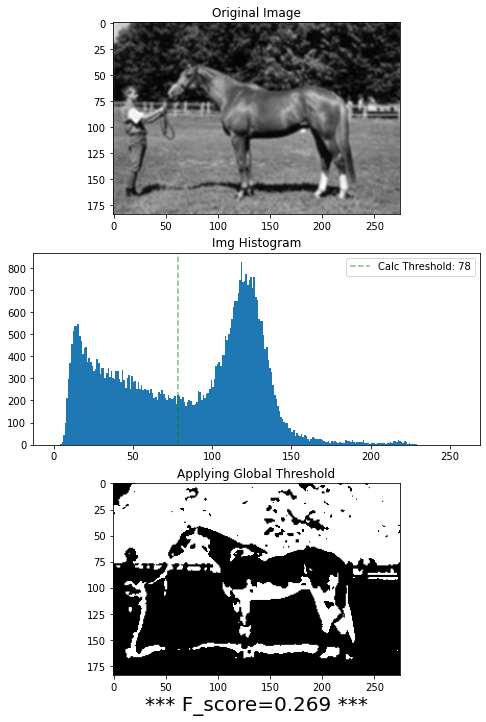

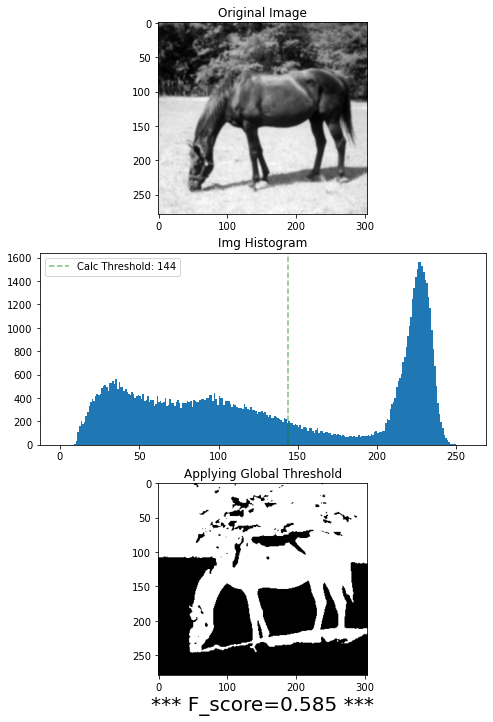

In [7]:
f_vals = [];
for horse,gt in zip(horses,GT):
    f_vals.append(plot_img_global_th(horse,gt))
f_vals = np.array(f_vals)

In [8]:
np.save('global_th_f_vals',f_vals)

In [9]:
print("F means - score: = {:.4f}".format(f_vals.mean()))

F means - score: = 0.6207


### Now, i will split the image into  parts, and then assign a global threshold on each part. afterwards i will merge those segmentation to see the final result - concatenated thresholded image.
the partitional local thresholding spilts the image horizontally or vertically, depends on image size

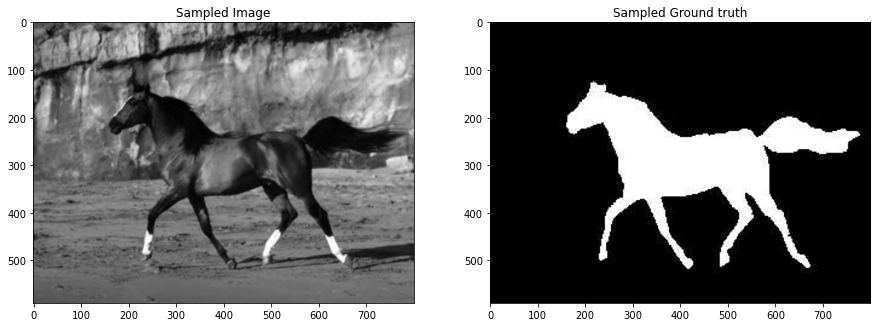

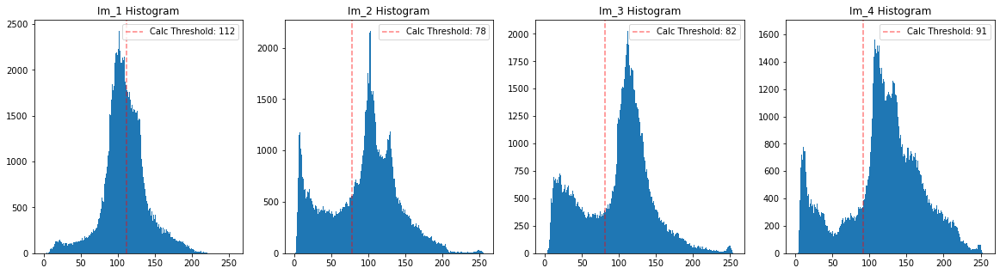

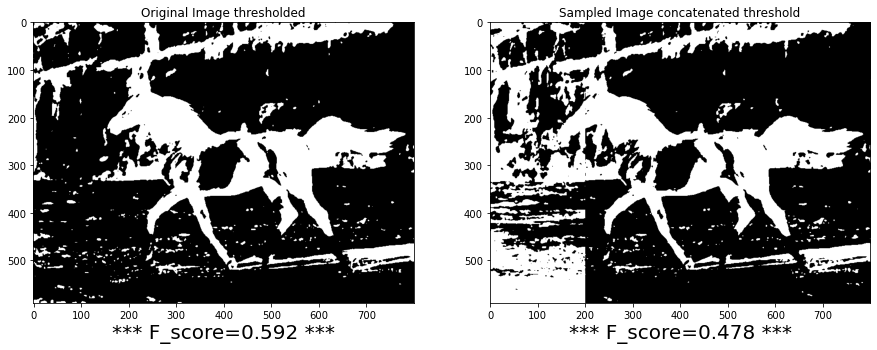

In [10]:
img_samp = cv2.imread(horses[0], cv2.IMREAD_GRAYSCALE)
img_samp = cv2.GaussianBlur(img_samp,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
gt = img_Resize(GT[0],(img_samp.shape[1],img_samp.shape[0]))
f, ((ax1, ax2)) = plt.subplots(1, 2,figsize=(15,15))
ax1.imshow(img_samp) ; ax1.set_title('Sampled Image')
ax2.imshow(gt); ax2.set_title('Sampled Ground truth')
plt.show()
local = []
flag = 0
if img_samp.shape[1] % 3 == 0:
    local = np.split(img_samp, 3, axis = 1)
elif img_samp.shape[1] % 4 == 0:
    local = np.split(img_samp, 4, axis = 1)
elif img_samp.shape[1] % 5 == 0:
    local = np.split(img_samp, 5, axis = 1)
elif img_samp.shape[1] % 2 == 0:
    local = np.split(img_samp, 2, axis = 1)
if local == []:
    flag = 1
    if img_samp.shape[0] % 3 == 0:
        local = np.split(img_samp, 3, axis = 0)
    elif img_samp.shape[0] % 4 == 0:
        local = np.split(img_samp, 4, axis = 0)
    elif img_samp.shape[0] % 5 == 0:
        local = np.split(img_samp, 5, axis = 0)
    elif img_samp.shape[0] % 2 == 0:
        local = np.split(img_samp, 2, axis = 0)
    
th_img = []
fig, axs = plt.subplots(1,len(local), figsize=(20,5), facecolor='w', edgecolor='k')
for i in range(len(local)):
    t = th_global(local[i])
    th_img.append(cv2.threshold(local[i],t,255,cv2.THRESH_BINARY_INV))
    axs[i].hist(local[i].ravel(),256,[0,256]); axs[i].set_title('Im_{0} Histogram'.format(i+1))
    axs[i].axvline(t,color='r',linestyle="dashed", alpha = 0.5, label = "Calc Threshold: {:.0f}".format(t))
    axs[i].legend()
th_concat = np.hstack(item for t,item in th_img) if flag ==0 else np.vstack(item for t,item in th_img)
plt.show() 
fig, ((ax1, ax2)) = plt.subplots(1, 2,figsize=(15,15))
ax1.imshow(cv2.threshold(img_samp,th_global(img_samp),255,cv2.THRESH_BINARY_INV)[1]) ; ax1.set_title('Original Image thresholded')
ax1.set_xlabel("*** F_score={:0.3f} ***".format(f_vals[0]),fontsize=20)
ax2.imshow(th_concat); ax2.set_title('Sampled Image concatenated threshold')
ax2.set_xlabel("*** F_score={:0.3f} ***".format(f_evaluataion(th_concat, gt)),fontsize=20)
plt.show() 
    

**As can be seen by the sampled picture above, the performance of the concatenated local thresholding yielded worse F - score.
That doesnt mean that applying localy thershold is worse than a global one, because as seen in the histogram above, the algorithm for finding single threshold doesnt always yield the optimal threshold between peaks of histogram. there is a need for more robust global thresholding algorithm such as Otsu’s Thresholding Method (1979)**

Lets try applying the concatenated threshold method on the full dataset, and look for the mean F-score, of the global th method vs the concat th method

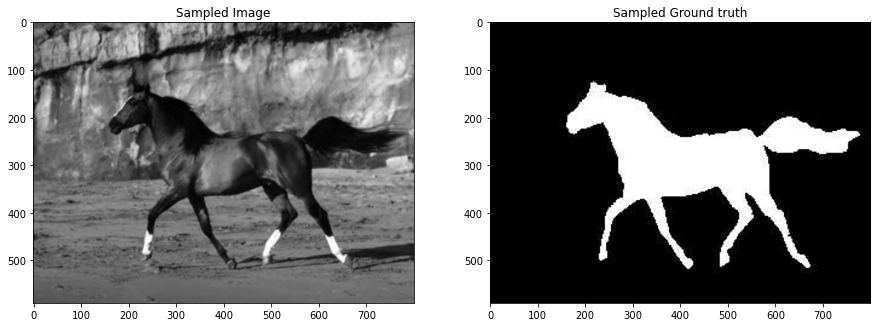

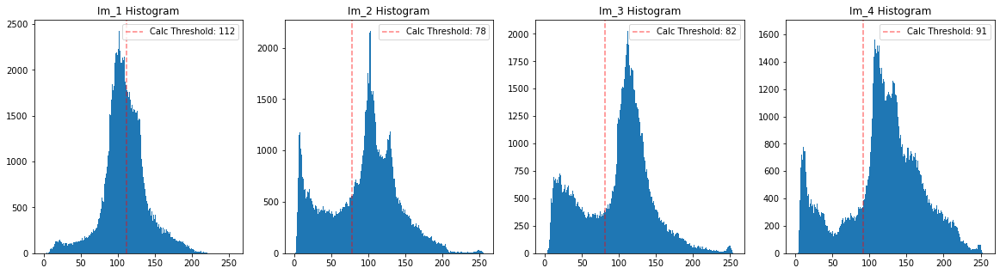

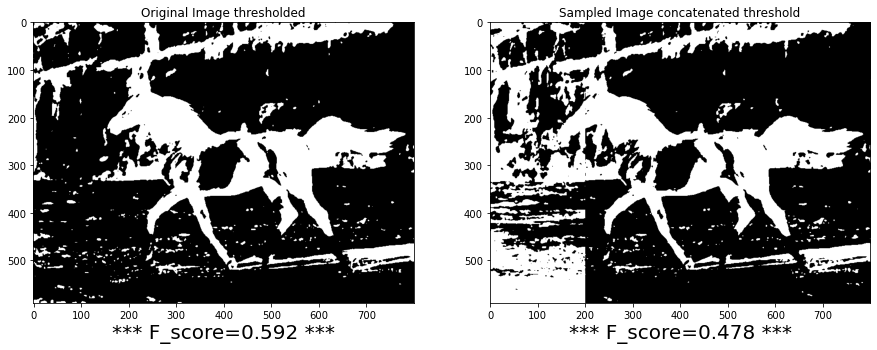

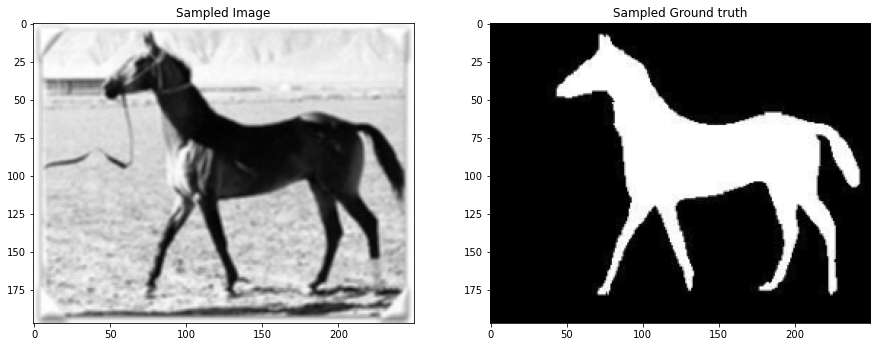

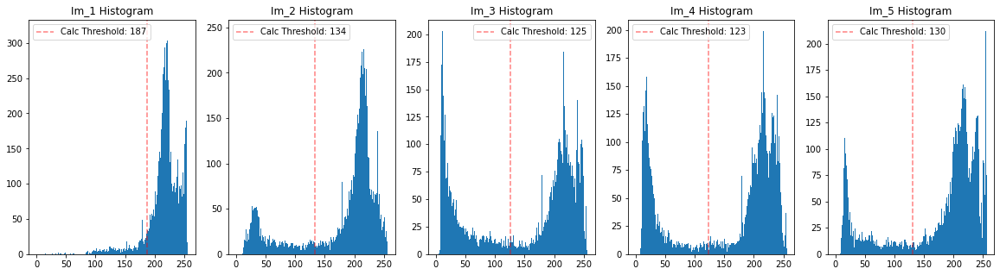

...

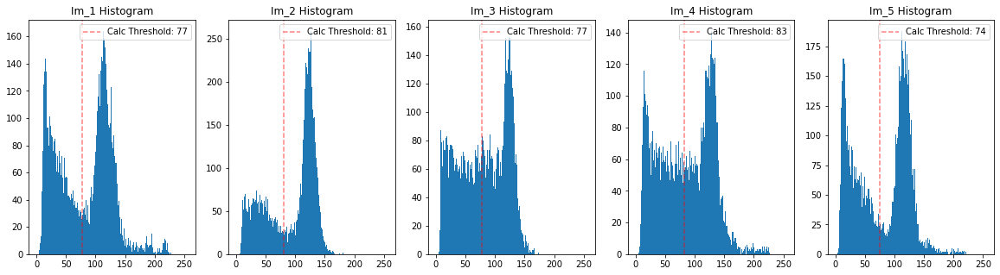

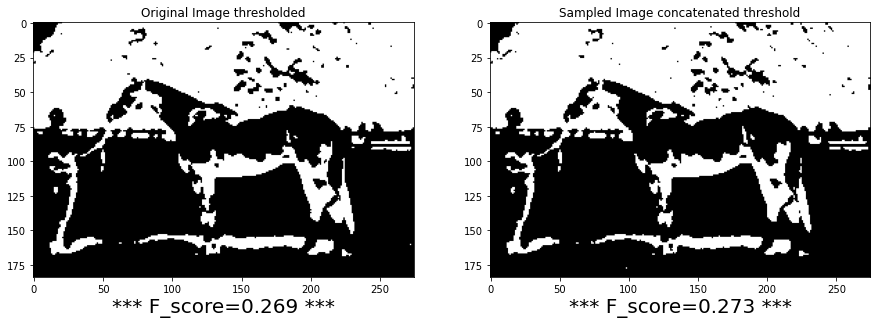

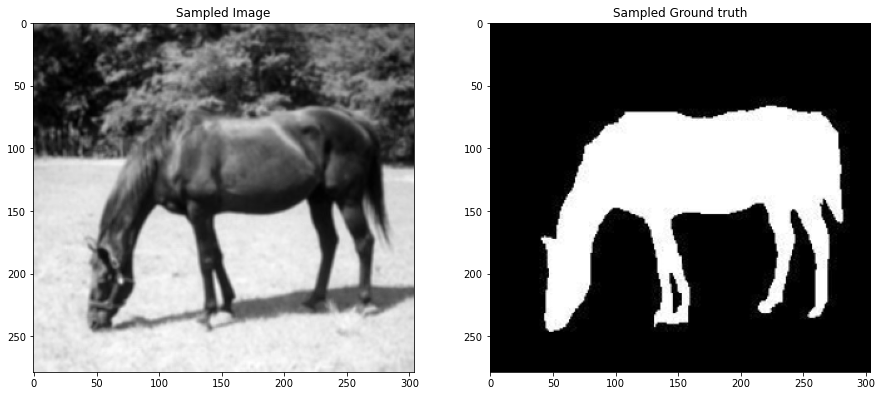

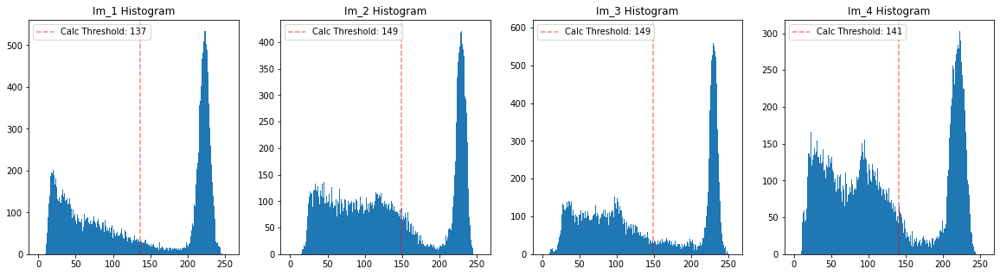

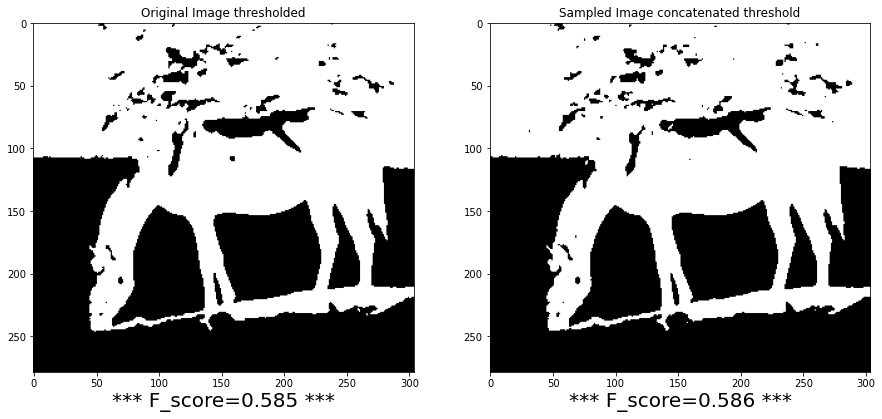

In [11]:
concat_f_vals = []
ind = 0
for horse,gt in zip(horses,GT):
    img_samp = cv2.imread(horse, cv2.IMREAD_GRAYSCALE)
    img_samp = cv2.GaussianBlur(img_samp,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
    gt = img_Resize(gt,(img_samp.shape[1],img_samp.shape[0]))
    f, ((ax1, ax2)) = plt.subplots(1, 2,figsize=(15,15))
    ax1.imshow(img_samp) ; ax1.set_title('Sampled Image')
    ax2.imshow(gt); ax2.set_title('Sampled Ground truth')
    plt.show()
    local = []
    flag = 0
    if img_samp.shape[1] % 3 == 0:
        local = np.split(img_samp, 3, axis = 1)
    elif img_samp.shape[1] % 4 == 0:
        local = np.split(img_samp, 4, axis = 1)
    elif img_samp.shape[1] % 5 == 0:
        local = np.split(img_samp, 5, axis = 1)
    elif img_samp.shape[1] % 7 == 0:
        local = np.split(img_samp, 7, axis = 1)
    elif img_samp.shape[1] % 2 == 0:
        local = np.split(img_samp, 2, axis = 1)
    if local == []:
        flag = 1
        if img_samp.shape[0] % 3 == 0:
            local = np.split(img_samp, 3, axis = 0)
        elif img_samp.shape[0] % 4 == 0:
            local = np.split(img_samp, 4, axis = 0)
        elif img_samp.shape[0] % 5 == 0:
            local = np.split(img_samp, 5, axis = 0)
        elif img_samp.shape[0] % 7 == 0:
            local = np.split(img_samp, 7, axis = 0)
        elif img_samp.shape[0] % 2 == 0:
            local = np.split(img_samp, 2, axis = 0)
    th_img = []
    fig, axs = plt.subplots(1,len(local), figsize=(20,5), facecolor='w', edgecolor='k')
    for i in range(len(local)):
        t = th_global(local[i])
        th_img.append(cv2.threshold(local[i],t,255,cv2.THRESH_BINARY_INV))
        axs[i].hist(local[i].ravel(),256,[0,256]); axs[i].set_title('Im_{0} Histogram'.format(i+1))
        axs[i].axvline(t,color='r',linestyle="dashed", alpha = 0.5, label = "Calc Threshold: {:.0f}".format(t))
        axs[i].legend()
    if local == []:
        t = th_global(img_samp)
        _,th_concat = cv2.threshold(img_samp,t,255,cv2.THRESH_BINARY_INV)
        concat_f_vals.append(f_evaluataion(th_concat, gt))
    else:
        th_concat = np.hstack(item for t,item in th_img) if flag ==0 else np.vstack(item for t,item in th_img)
        concat_f_vals.append(f_evaluataion(th_concat, gt))
#     th_concat = np.hstack(item for t,item in th_img) if flag ==0 else np.vstack(item for t,item in th_img)
#     concat_f_vals.append(f_evaluataion(th_concat, gt))
    plt.show() 
    f, ((ax1, ax2)) = plt.subplots(1, 2,figsize=(15,15))
    ax1.imshow(cv2.threshold(img_samp,th_global(img_samp),255,cv2.THRESH_BINARY_INV)[1]) ; ax1.set_title('Original Image thresholded')
    ax1.set_xlabel("*** F_score={:0.3f} ***".format(f_vals[ind]),fontsize=20)
    ax2.imshow(th_concat); ax2.set_title('Sampled Image concatenated threshold')
    ax2.set_xlabel("*** F_score={:0.3f} ***".format(concat_f_vals[ind]),fontsize=20)
    plt.show() 
    ind+= 1
concat_f_vals = np.array(concat_f_vals)

In [12]:
np.save('concatenated_thresholds_f_vals',concat_f_vals)

In [13]:
print("* "*50)  
print("F - score of global threshold = {:.4f}\n".format(f_vals.mean()))
print("F - score of concatenated thresholds = {:.4f}\n".format(concat_f_vals.mean()))
print("There wasnt any improvement in the F-score using the concatenated thresholds ")
print("* "*50)  

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * 
F - score of global threshold = 0.6207

F - score of concatenated thresholds = 0.6001

There wasnt any improvement in the F-score using the concatenated thresholds 
* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * 


## 2) Adaptive thresholding

After approaching a global thresholding method, and a more local method by dividing the image into several sub images, applying local thresholds and than concatenating all, let pick different approach.
what about assigning each pixel a threshold?
For adapting a threshold, one can apply local properties on a chosen patch (e.g. statistics), hence i will choose to perform convolution between a chosen patch, and a kernel:
$$\Large T[i_x,i_y] = I * Z =  \sum_{j=-z}^{z}\sum_{k=-z}^{z}I[k,j]\cdot Z[i_x - k, i_y - j]  $$
where Z is the kernel used for convolution,z is the "radius of the kernel Z, I is the image.
I will demonstarte two possible kernels to obtain local adaptive thresholding:
1. Mean kernel where for example a kernel sized 3 will obtain: $$Z_{[3X3]} = \begin{bmatrix} 1/9 & 1/9 & 1/9 \\ 1/9 & 1/9 & 1/9 \\ 1/9 & 1/9 & 1/9 \end{bmatrix}$$
2. Gaussian kernel which is defined by $$\large Z_{[i,j]} =\alpha \cdot \frac{1}{2\pi\sigma ^2}\large e^{-\frac{i^2+j^2}{2\sigma ^2}}$$ where $\alpha$ is the normalization factor which sums the kernel matrix into 1

Now, after applying convolution, T matrix contains a local threshold for each pixel of the original image. all is left is to apply this threshold for each pixel which is easy.

In [14]:
def Adap_th_mean(img , kernel_size, method = "bin_inv"):
    I = img.copy()
    if (kernel_size % 2) == 0:  # check if the size is even
        kernel_size += 1  # if it does -> make odd. by +1 we more % of the signal
    kernel = np.ones((kernel_size, kernel_size)) / (kernel_size**2)
    t = signal.convolve2d(I,kernel, mode='same')
    if method == "bin":
        I[I <= t] = 0
    if method =="bin_inv":
        I[I > t] = 0
    I[I > 0] = 255
    return I

def kernel_Gauss(kernel_size,sigma): #creates gaussian kernel with given size, and std (sigma)
    ax = np.linspace(- (kernel_size-1) / 2,  (kernel_size-1) / 2,  kernel_size)
    xx, yy = np.meshgrid(ax,ax)
    kernel = (1 / (2 * np.pi * sigma ** 2)) * np.exp(-(np.square(xx) + np.square(yy)) / (2 * (sigma ** 2)))
    return kernel / kernel.sum()

def Adap_th_gauss(img , kernel_size, method = "bin_inv"):
    I = img.copy()
    sigma = 0.3*((kernel_size-1)*0.5 - 1) + 0.8
    if (kernel_size % 2) == 0:  # check if the size is even
        kernel_size += 1  # if it does -> make odd. by +1 we more % of the signal
    kernel = kernel_Gauss(kernel_size,sigma)
    t = signal.convolve2d(I,kernel, mode='same')
    if method == "bin":
        I[I <= t] = 0
    if method =="bin_inv":
        I[I > t] = 0
    I[I > 0] = 255
    return I

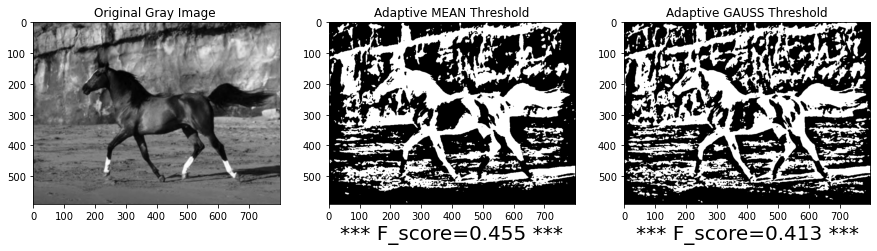

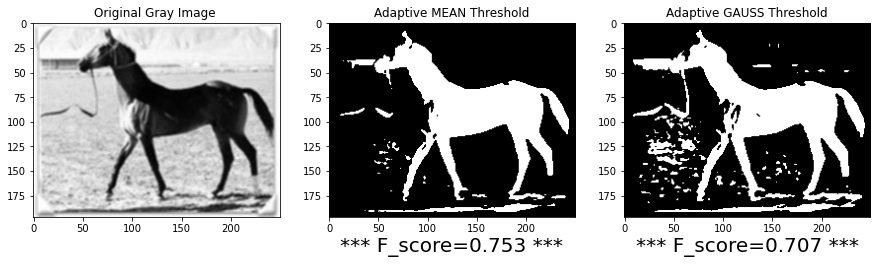

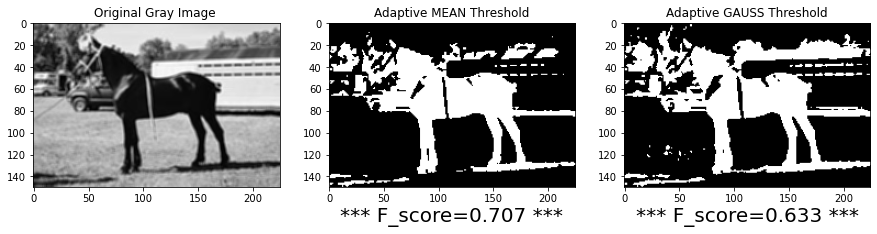

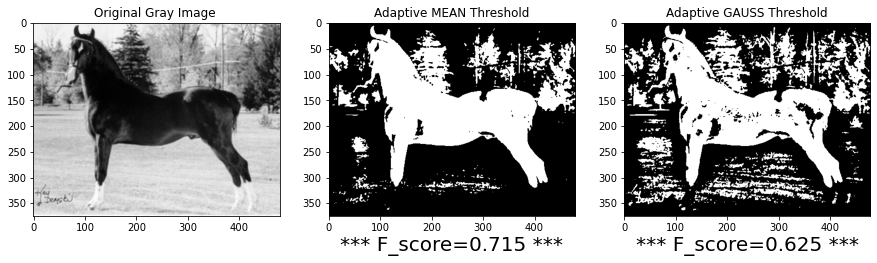

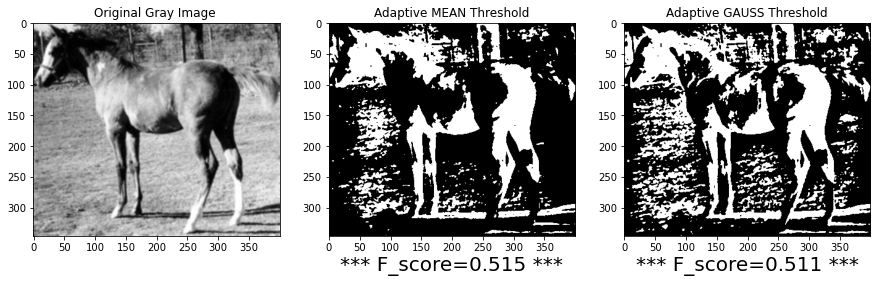

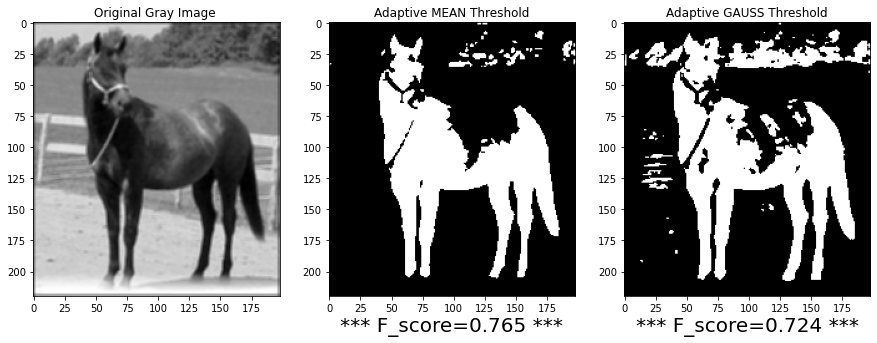

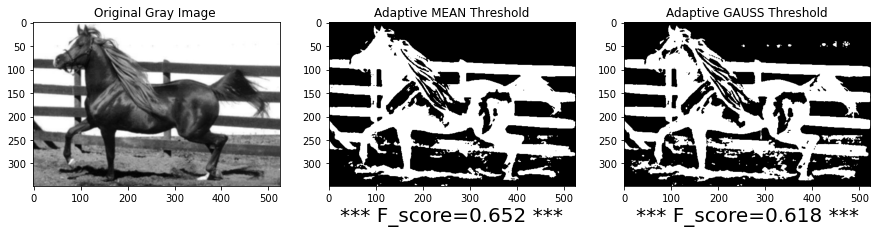

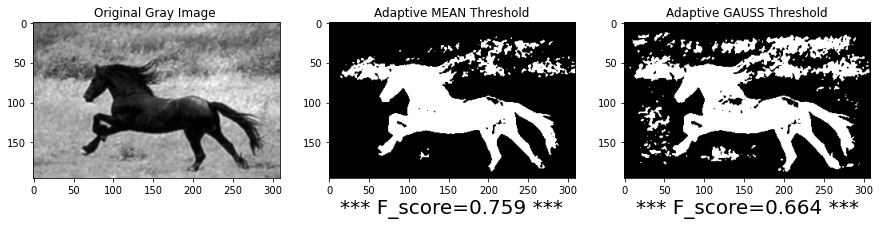

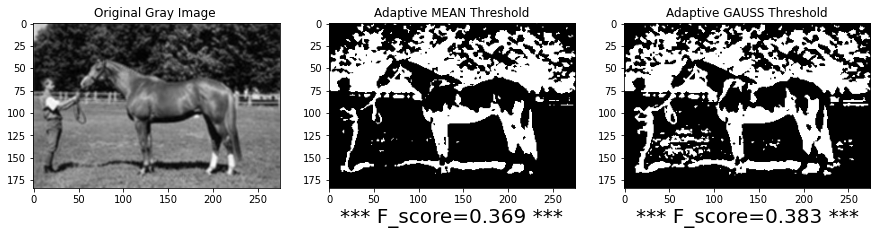

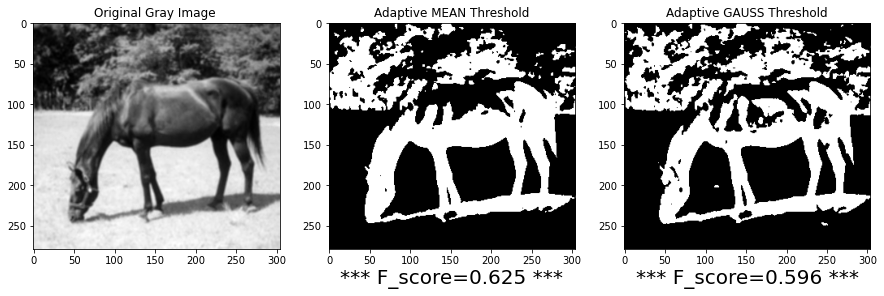

In [15]:
f_adap_mean=np.zeros(len(horses));f_adap_gauss=np.zeros(len(horses))
for num_of_im in range(len(horses)):
    img_samp = cv2.imread(horses[num_of_im], cv2.IMREAD_GRAYSCALE)
    img_samp = cv2.GaussianBlur(img_samp ,(3,3),cv2.BORDER_DEFAULT) #apply some smoothing
    gt = img_Resize(GT[num_of_im],(img_samp.shape[1],img_samp.shape[0]))
    thh_inv = Adap_th_mean(img_samp , 109, method = "bin_inv")
    thh_inv_g = Adap_th_gauss(img_samp,109, method = "bin_inv")
    f_adap_mean[num_of_im] = f_evaluataion(thh_inv, gt)
    f_adap_gauss[num_of_im] = f_evaluataion(thh_inv_g, gt)
    fig, ((ax1, ax2, ax3)) = plt.subplots(1, 3,figsize=(15,15))
    ax1.imshow(img_samp) ; ax1.set_title('Original Gray Image ')
    ax2.imshow(thh_inv); ax2.set_title('Adaptive MEAN Threshold')
    ax2.set_xlabel("*** F_score={:0.3f} ***".format(f_adap_mean[num_of_im]),fontsize=20)
    ax3.imshow(thh_inv_g) ; ax3.set_title('Adaptive GAUSS Threshold')
    ax3.set_xlabel("*** F_score={:0.3f} ***".format(f_adap_gauss[num_of_im]),fontsize=20)
    plt.show() 

In [16]:
# print("adaptive mean avg score: {:0.3f}\nadaptive mean avg score: {:0.3f}".format(f_adap_mean.mean(),f_adap_gauss.mean()))
print("* "*50)  
print("F - score of adaptive mean threshold = {:.4f}\n".format(f_adap_mean.mean()))
print("F - score of adaptive gauss threshold = {:.4f}\n".format(f_adap_gauss.mean()))
print("* "*50)  

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * 
F - score of adaptive mean threshold = 0.6315

F - score of adaptive gauss threshold = 0.5874

* * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * * 


In [17]:
np.save('adaptive_mean_f_vals',f_adap_mean);
np.save('adaptive_gauss_f_vals',f_adap_gauss);

## 3) Region growing

Now, ill apply the "Region growing method. this method is based on choosing seeds, and then for each seeds, finding his "similar" neighbors, and creating a region of those similar pixels.
the tricky part of the method is which pixels to choose as seeds, and how many of those is necessary to choose in order to get a robust segmentation. in general, i found 3 main suggestions:
- manual seeds pick - a user can choose a seed with mouse click or just assigning constant seeds for any image.
- semi automated seeds pick - based on prior knowledge on the segmented picture, the seeds can be hardcoded
- fully automated seeds pick - can be chosen using the mathemtical features of a image. i.e finding local minimas of an image
after picking the seeds, all is to find spread around the seed and to find similar pixels. i defined similiar pixels by euclidean distance of the RGB pixels between a seed and his neighbors.
to wrap the algorithm up, to return the optimal segmentation, i assigned automated procedure on picking number of local minimas and threshold on the euclidean distance. by iterating,  it finds the best yielded segmentation ( best measured by highest F-score).

in a more practical way, the algorithm i suggest is as follows:
1. Find the $30^{th}$(or less) minimal local minimas of the image. (30 is a chosen threshold by trials and errors)
2. For each seed, apply BFS(Breadth-First Search) using Queue data structure, to find nearest similar neighbors, and add them to region:
    - q = Queue()
    - q.Enqueue(seed)
    - While q is not empty
        - p = q.Dequeuq()
        - For each neighbor $\widetilde{p}$ of p:
            - if $\widetilde{p}$ and p similar(Euclidean RGB dist < Threshold) and $\widetilde{p}$ not already labeled then:
                - q.Enqueue($\widetilde{p}$) , label($\widetilde{p}$)
                
3. Start with initial threshold = 3, Apply region growing iterativly, with different threshold to find optimal threshold that yields robust segmentation

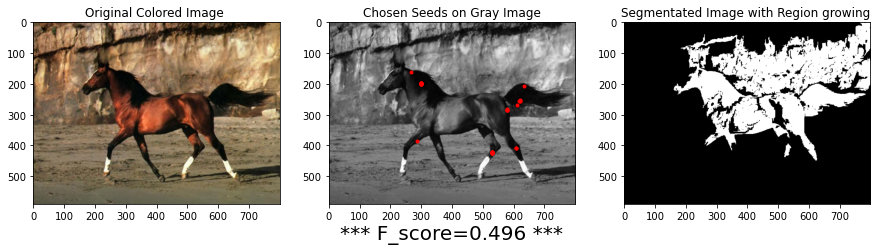

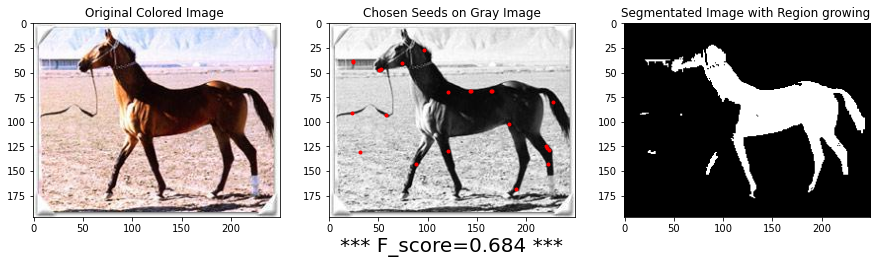

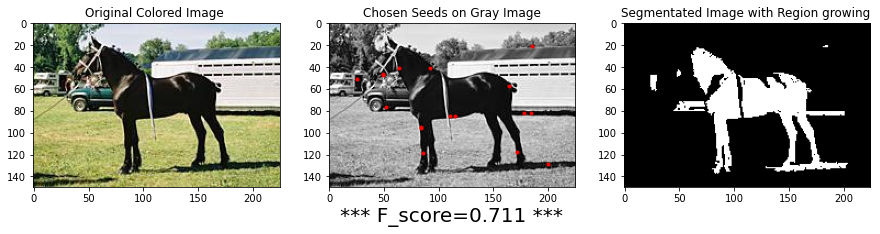

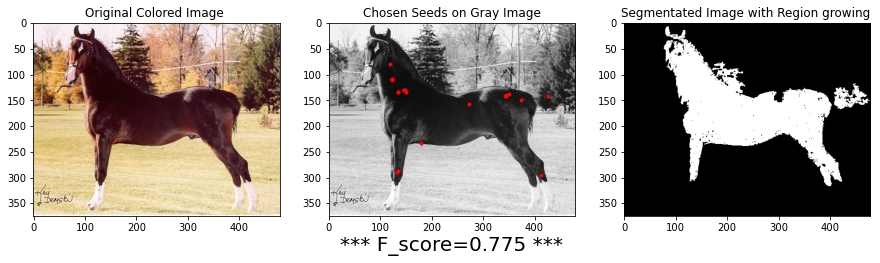

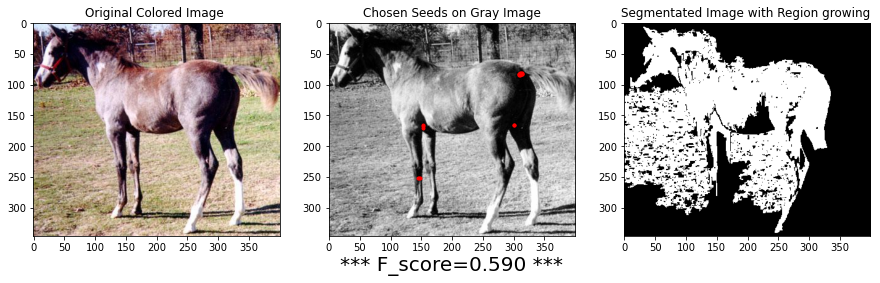

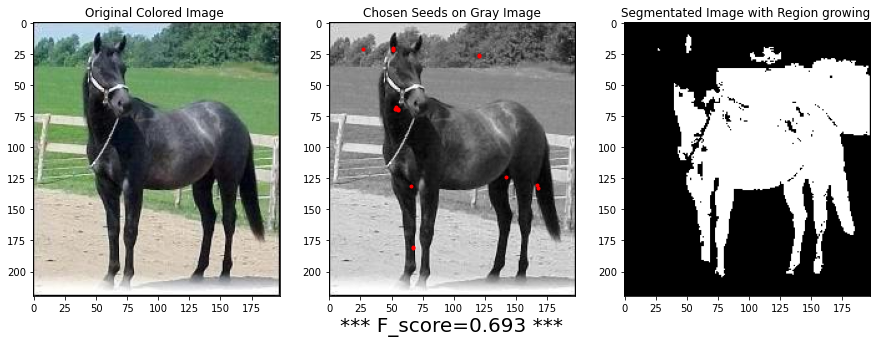

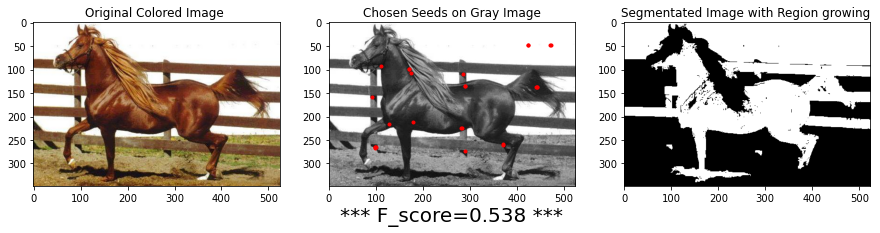

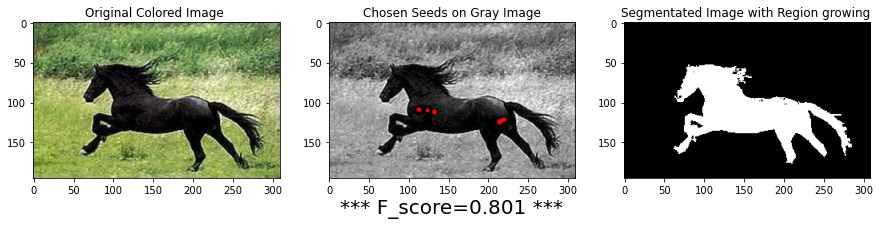

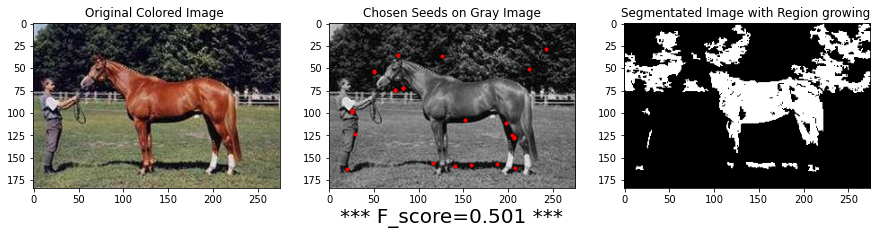

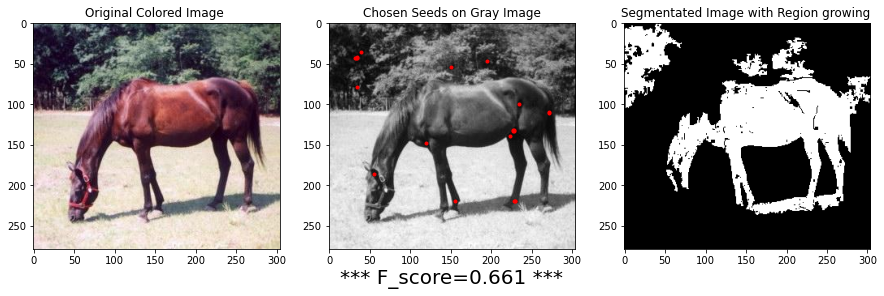

In [18]:
class Queue:
    def __init__(self):
        self.items = []

    def isEmpty(self):
        return self.items == []

    def enqueue(self, item):
        self.items.insert(0,item)

    def dequeue(self):
        return self.items.pop()

    def size(self):
        return len(self.items)

def generate_seeds(img_samp): #input: a gray image
    img_samp = cv2.GaussianBlur(img_samp ,(3,3),cv2.BORDER_DEFAULT) #apply some smoothing
    dist = 10
    flag = False
    #get local minimas of image intensity and use them as seeds
    while flag is False:
        seeds = peak_local_max(img_samp.max() - img_samp, min_distance=dist, indices=True) 
        #iterate until the seeds filtered to equal or less to 30 seeds (found this value by trials and errors)
        if seeds.shape[0]<= 30:
            flag = True
        dist+=10
    return seeds #return seeds which is list of coordinates


def region_growing_BFS(img_samp,img_samp_color,T,connectivity=8): #USING BFS and Queue DataStruct to find the growing region of a seed
    seeds = generate_seeds(img_samp) 
     #img_samp IS GrayScale IMAGE!!! 
    #img_samp_color IS RGB IMAGE!!! 
    rg_img = np.zeros(img_samp_color[:, :, 0].shape)
    ngbrs = [(0,-1),(0,1),(-1,0),(1,0),(-1, -1), (-1, 1), (1, -1), (1, 1)] # if connectivity is 4 than reads only first 4 items, else reads all 8
    height, width = img_samp_color[:, :, 0].shape
    for i in range(seeds.shape[0]):#
        seed = seeds[i]
        q = Queue()
        q.enqueue(seed)
        ###APPLY BFS:
        count2 =0
        while q.size() > 0:
            p = q.dequeue()
            rg_img[p[0], p[1]] = 255
            for j in range(connectivity): # For each neighbor of the pixel, connectivity = 4 || 8
                # Compute the neighbor pixel position
                x_new = p[0] + ngbrs[j][0]
                y_new = p[1] + ngbrs[j][1]
                # Boundary Condition - check if the coordinates are inside the image
                check_inside = (x_new >= 0) & (y_new >= 0) & (x_new < height) & (y_new < width)
                # Check neighbor if inside boundries and not already "labeled" (inside rg_img)
                if check_inside:
                    if rg_img[x_new, y_new] == 0:
                        #change the threshold to RGB EUCLIDEAN DISTANCE
                        R = int(img_samp_color[p[0], p[1], 0])
                        G = int(img_samp_color[p[0], p[1], 1])
                        B = int(img_samp_color[p[0], p[1], 2])
                        RR = int(img_samp_color[x_new, y_new, 0])
                        GG = int(img_samp_color[x_new, y_new, 1])
                        BB = int(img_samp_color[x_new, y_new, 2])
                        dist = ((RR - R) ** 2 + (GG - G) ** 2 + (BB - B) ** 2) ** 0.5 #euclidean distance between the RGB colors of a pixel and his neighbor
                        if dist < T: # if the pixels similar by defined Threshold, then label the pixel
                            q.enqueue((x_new, y_new))
                            rg_img[x_new, y_new] = 255
    return rg_img,seeds

def region_growing_optimal(img_samp,img_samp_color,gt,T=3,connectivity=4):
    t = T
    f = 0
    segmat,seeds = region_growing_BFS(img_samp,img_samp_color,t,connectivity)
    f_next = f_evaluataion(segmat, gt)
    while f_next > f:
        f = f_next
        t+=1
        best_segmat = segmat
        best_seeds = seeds
        segmat,seeds = region_growing_BFS(img_samp,img_samp_color,t,connectivity)
        f_next = f_evaluataion(segmat, gt)
    t+=1
    f_new = f_next
    segmat,seeds = region_growing_BFS(img_samp,img_samp_color,t,connectivity)
    f_next = f_evaluataion(segmat, gt)
    if f_next < f:
        return f,best_segmat,best_seeds
    
    while f_next > f_new:
        f_new = f_next
        t+=1
        best_segmat = segmat
        best_seeds = seeds
        segmat,seeds = region_growing_BFS(img_samp,img_samp_color,t,connectivity)
        f_next = f_evaluataion(segmat, gt)
    return f_new,best_segmat,best_seeds

    
f_region=np.zeros(len(horses))
for num_of_im in range(len(horses)):
    img_samp = cv2.imread(horses[num_of_im], cv2.IMREAD_GRAYSCALE)
    img_samp_color =cv2.cvtColor(cv2.imread(horses[num_of_im]), cv2.COLOR_BGR2RGB) #read color image
    gt = img_Resize(GT[num_of_im],(img_samp.shape[1],img_samp.shape[0]))
    f, segmat,markers=region_growing_optimal(img_samp,img_samp_color,gt,T=3,connectivity=4)
    f_region[num_of_im] = f
    fig, ((ax1, ax2, ax3)) = plt.subplots(1, 3,figsize=(15,15))
    ax1.imshow(img_samp_color) ; ax1.set_title('Original Colored Image ')
    ax2.imshow(img_samp); ax2.set_title('Chosen Seeds on Gray Image')
    ax2.plot(markers[:,1],markers[:,0],"r.")
    ax3.imshow(segmat) ; ax3.set_title('Segmentated Image with Region growing ')
    ax2.set_xlabel("*** F_score={:0.3f} ***".format(f),fontsize=20)
    plt.show() 

In [19]:
f_region.mean()

0.6450000000000001

In [20]:
np.save('region_growing_f_vals',f_region)

## 4) K-means clustering

The presented K-means clustering algorithm for image segmentation, accpets both color and gray images:
1. get a gray/RGB image and process it to a 1D/3D column vector
2. choose k clusters, epsilon of convergence, maximum allowed iterations.
3. choose at random k pixels and assign them as the centroids of the image
4. calculate euclidean distance $\Large \sum_{i\in clusters} {\sum_{j\in elements\: of\: i'th\: cluster} \LARGE||p_j - \mu_i||^2}  $
5. label each pixels and a closest centroid as cluster, labeled = 0,1,2...
6. calculate new mean for cluster and assign the new means as the centroids
5. repeat until convergence / max iteration term


In [21]:
def k_means_segment(img_samp,k,eps = 2,max_iter = 30):
    """input:
        an image ( gray or RGB) ;
        k of means;
        epsilon to converge;
        maximum iterations allowed"""
    
    """ return:
        labled matrix (SHAPED 1D or 3D COLUMN VECTOR);
        centroids;
        number of iterations;
        epsilon of convergence """
#     img_samp = cv2.GaussianBlur(img_samp ,(3,3),cv2.BORDER_DEFAULT) #apply some smoothing
    if len(img_samp.shape) >2:
            #color k mean
        r = img_samp[:,:,0].ravel()
        r = r.reshape(r.shape[0],1)
        r = np.float32(r)
        g = img_samp[:,:,1].ravel()
        g = g.reshape(g.shape[0],1)
        g = np.float32(g)
        b = img_samp[:,:,2].ravel()
        b = b.reshape(b.shape[0],1)
        b = np.float32(b)
        Z = np.hstack((r,g,b))

    else: #grayscale k mean
        z = img_samp.ravel()
        z = z.reshape(z.shape[0],1)
        Z = np.float32(z)
        
    labels,cents,itr_num,eps_conv = k_means_clustr(Z,k,eps,max_iter)#apply k means clustering
    cents = np.uint8(cents)
    segment = cents[labels.flatten()]
    segment = segment.reshape((img_samp.shape))
#     plt.imshow(segment)
    return segment,cents,itr_num,eps_conv


In [22]:
def k_means_clustr(z, k, eps=2, max_iter=30):
    '''Applying K-means clustering'''
    """z is column vector, can be multiDimentional i.e. 1D(intensity of grayscale) or 3D(intensity of RGB) etc..."""
    """ k is the number of clusters/centroids"""
    """ return:
            labled matrix (SHAPED 1D or 3D COLUMN VECTOR);
            centroids; 
            num of iterations; 
            epsilon of convergence """
    # define random centroids:
    centroids = z.copy()
    np.random.shuffle(centroids)
    cent = centroids[np.random.choice(centroids.shape[0], k, replace=False), :]
    if z.shape[1] == 1:  # if Z dimension's is 1
        cent = np.random.choice(np.arange(0, 256), k, replace=False).reshape((k, 1))
    cents_new = cent.copy() + 5
    max_iter_cnt = 0
    # start the algorithm:
    while max_iter_cnt < max_iter and np.abs(cent.sum() - cents_new.sum()) > eps:
        cent = cents_new.copy()
        max_iter_cnt += 1
        sqr_dist = np.sqrt(((z - cent[:, np.newaxis]) ** 2).sum(
            axis=2))  # compute the euclidean distance between the dimenstions and centroids
        labels = np.argmin(sqr_dist, axis=0)  # get labled matrix for each image's pixel
        # calculate new k centroids by applying mean
        for i in range(k):
            if z[labels == i].sum()<1: # if any cluster is empty by random chance - reiterate (there is a probability of this to happen)
                max_iter_cnt = 0 #start re - iterating due to random empty segment
                cents_new = centroids[np.random.choice(centroids.shape[0], k, replace=False), :]
                if z.shape[1] == 1:  # if Z dimension's is 1
                    cents_new = np.random.choice(np.arange(0, 256), k, replace=False).reshape((k, 1))
                break
            cents_new[i] = np.array(z[labels == i].mean(axis=0))
        if cents_new[cents_new < 1].sum() >0:
            return None
    return labels, cents_new, max_iter_cnt, np.abs(cent.sum() - cents_new.sum())
# return the labled matrix (SHAPED 1D COLUMN VECTOR) and the centroids to apply centroid values to all pixels

In [23]:
def get_bin_kmean_segment(img,gt,centr):
    '''Find amidst segments the segment closest to Groung Truth '''
    '''input: kmeans segmented img, ground truth, centroids of clusters'''
    '''output: 1) the most similar segmented part to ground truth
               2) F-score '''
    segment_kmean = np.zeros(img.shape).astype(np.uint8)
    F_score = 0
    for i in range(centr.shape[0]):
        wrk = img.copy()
        wrk[wrk != centr[i][0]]=0
        wrk[wrk == centr[i][0]]=255
        f_eval = f_evaluataion(wrk,gt)
#         plt.imshow(wrk)
#         plt.show()
#         print(f_eval)
        if f_eval > F_score:
            F_score = f_eval
            segment_kmean = wrk.copy()
#         plt.imshow(wrk)
#         plt.show()
#         print(f_eval)
    return segment_kmean,F_score

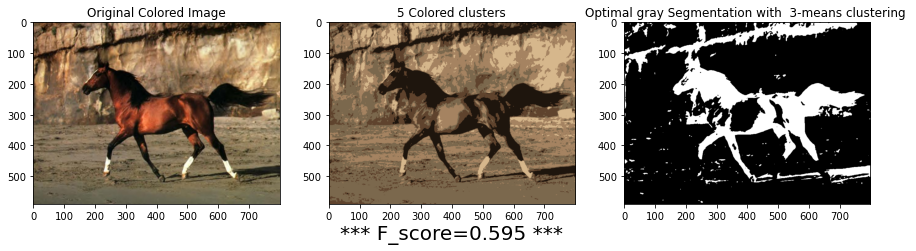

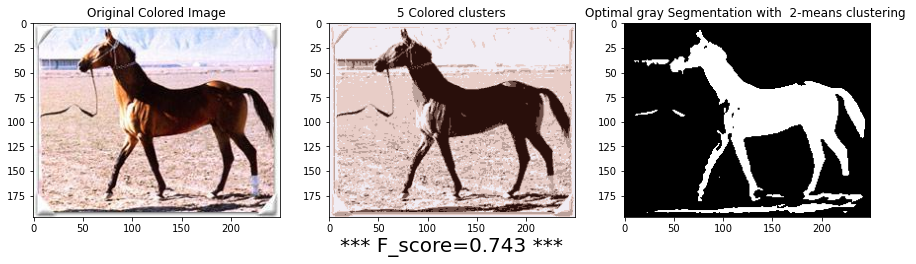

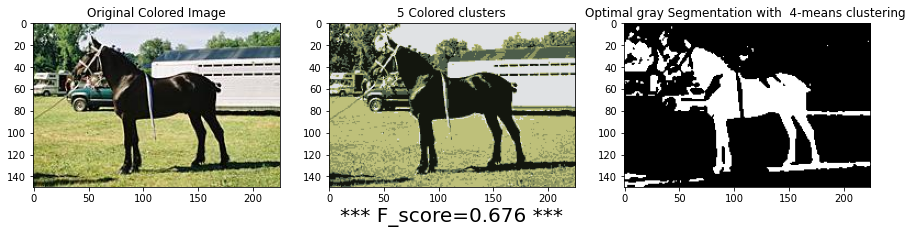

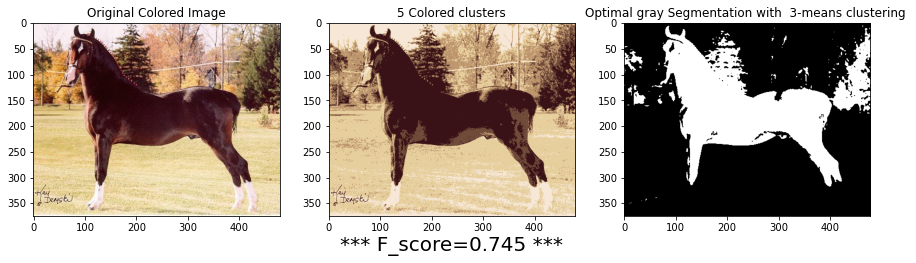

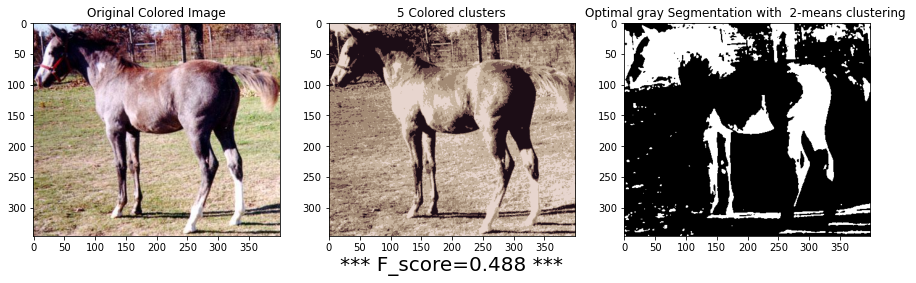

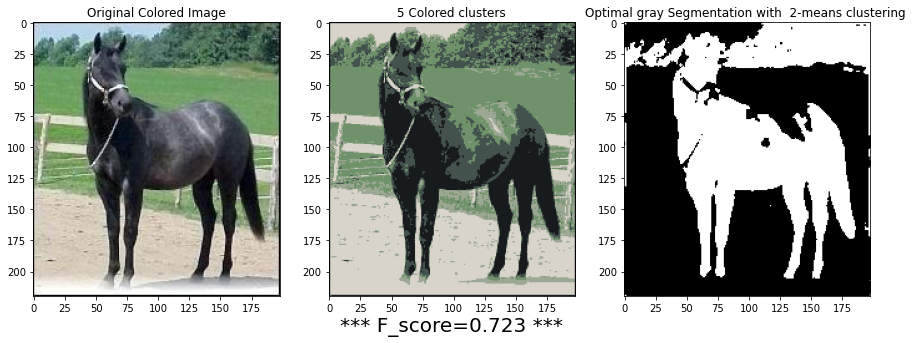

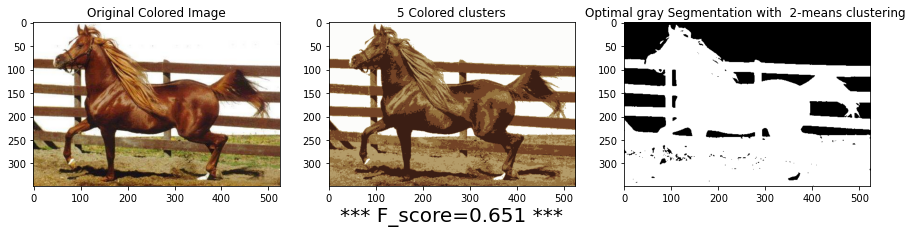

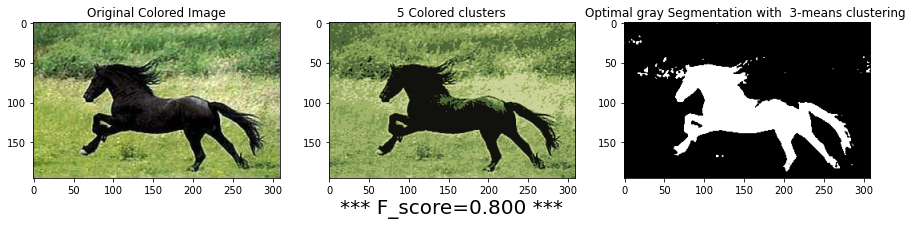

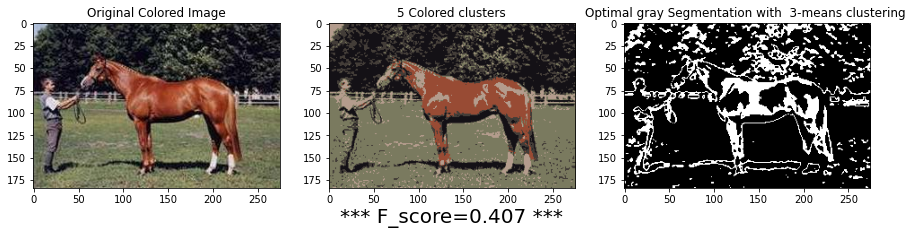

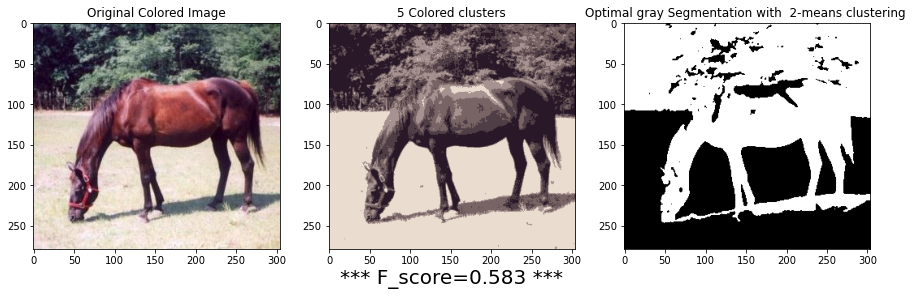

In [24]:
img_kmean_lst = []
f_kmean =np.zeros(len(horses))
k_chosen =np.zeros(len(horses))
for num_of_im in range(len(horses)): #Iterate over the image dataset
    img_samp = cv2.imread(horses[num_of_im], cv2.IMREAD_GRAYSCALE)
    img_samp = cv2.GaussianBlur(img_samp,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
    img_samp_color =cv2.cvtColor(cv2.imread(horses[num_of_im]), cv2.COLOR_BGR2RGB) #read color image
    gt = img_Resize(GT[num_of_im],(img_samp.shape[1],img_samp.shape[0]))
    F_score = 0;opt_seg =0;opt_k = 0;f_eval = 0
    flag = False
    k = 2 #initialized to 2, will be increasing though
    while flag is False: #start iterativly k means clustering to find k to produce maximal F-score
        seg_g,cent_g,_,_ = k_means_segment(img_samp ,k,eps = 2,max_iter = 100)
        segment_kmean,f_eval = get_bin_kmean_segment(seg_g,gt,cent_g)
        if F_score > f_eval:
            flag = True
            break
        F_score = f_eval
        opt_seg = segment_kmean.copy()
        k+=1
    opt_k = k-1
    f_kmean[num_of_im] = F_score ;     k_chosen[num_of_im] = opt_k ; img_kmean_lst.append(opt_seg) 
    k_clr = 5
    seg_clr,cent_clr,_,_ = k_means_segment(img_samp_color ,k_clr,eps = 2,max_iter = 100)
    fig, ((ax1, ax2, ax3)) = plt.subplots(1, 3,figsize=(15,15))
    ax1.imshow(img_samp_color) ; ax1.set_title('Original Colored Image')
    ax2.imshow(seg_clr); ax2.set_title('{0} Colored clusters'.format(k_clr))
    ax3.imshow(opt_seg) ; ax3.set_title('Optimal gray Segmentation with  {0}-means clustering '.format(opt_k))
    ax2.set_xlabel("*** F_score={:0.3f} ***".format(f_kmean[num_of_im]),fontsize=20)
    plt.show() 

In [25]:
f_kmean.mean(),k_chosen.mean()

(0.6411, 2.6)

In [26]:
np.save('k_means_f_vals',f_kmean)
np.save('kvals_kmeans_f_vals',k_chosen)

## 5) Graph Normalized cut

For the last algorithm, i'll apply Graph Normalized cut
1. gets a gray image and automatically descale by certain %, until  $width\cdot height \leq 5000$. 
       Typically resulting in a 10% -30% total size of an image.
       The image reduced due to not sufficient RAM in my home-used computer. nevertheless it reduces the computational time 
       drastically
       
2. Builds Affinity matrix , W, denoted by: $ W_{I_1,I_2} = \Large e^{-\frac{||I_1 - I_2||^2}{2\cdot \sigma ^2}}.\\$ After some trials & errors i used $\sigma = 30$ and the euclidean distance between two intensities.

    size of W: $(width_{scaled}\cdot height_{scaled}) X( width_{scaled}\cdot height_{scaled})$
  
  
3. Builds Diagonal matrix , D, where $\large D_i = \sum_{j}W_{ij}$ . 

    Sanity check: $Trace(D) = \sum_{j}\sum_{i}W_{ij} = \sum_{i}\sum_{j}W_{ij}$ 
    
    size of D: $(width_{scaled}\cdot height_{scaled}) X( width_{scaled}\cdot height_{scaled})$
    
    
4. Solve $(D-W)y = \lambda Dy$. reassure eigenvalues corresponds to eigenvectors as sorted in ascending order.


5. Get 2nd smallest eigenvector to bipartite the graph.


6. bipartited by median value and 0 value to compare both results


6. given specific depth, keep bipartiting the segments by recursion until suggested depth is reached. Notice that the bipartition in Ncut applying perfect Binary recursive Tree. i chose depth = 2.


## Notice RAM!!! might run out, hence IT IS IMPORTANT to restart kernel before applying Ncut algorithm.


In [ ]:
restartkernel()

### From this line and on, each line has to be executed seperatly due to high RAM usage. if you have more than 16GB RAM, ERASE THE LINE ABOVE  (restartkernel()) and enjoy living dangerously;) 

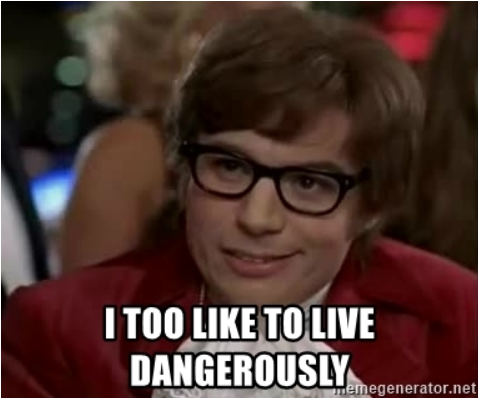

In [1]:
import seaborn as sns
import cv2
import matplotlib
import warnings
import matplotlib.pyplot as plt
import numpy as np
from scipy.linalg import null_space
from scipy.linalg import eigh
np.set_printoptions(suppress=True) # suppresses the use of scientific notation for small numbers
# This specifies the way plots behave in jupyter notebook
%matplotlib inline
plt.rcParams['image.cmap'] = 'gray'
warnings.filterwarnings("ignore")
from scipy import optimize,signal
from PIL import Image
from skimage.feature import peak_local_max
from tqdm.notebook import tqdm
import pandas as pd
from IPython.display import display_html
def restartkernel():
    display_html("<script>Jupyter.notebook.kernel.restart()</script>",raw=True)

In [2]:
def f_evaluataion(img, GT): # enter two thresholded gray images
    img[img > 0] = 1  # binary map of image
    GT[GT > 0] = 1  # binary map of GT
    e_gt = np.sum(img + GT == 2)
    e = np.sum(img)
    gt = np.sum(GT)
    if e == 0:
        return 0
    p = round(e_gt / e, 3)
    r = round(e_gt / gt, 3)
    f = round(2 * p * r / (p + r), 3)
    if np.isnan(f):
        return 0
#     return p, r, f
    return f

In [3]:
def img_Resize(path,size): #accepts path! not image
    im = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    im = cv2.resize(im, size, interpolation = cv2.INTER_AREA)
    return im

In [4]:
#GET ONLY 10 SAMPLES OF DATASET
horses= []
GT = []
for i in range(10):
    if i < 9:
        horses.append("horse00" + str(i+1) +".jpg")
        continue
    if i < 99:
        horses.append("horse0" + str(i+1) + ".jpg")
        continue
    horses.append("horse" + str(i+1) + ".jpg")

for i in range(10):
    GT.append("gt" + str(i + 1) + ".jpg")

In [5]:
def resize(img_samp,scale):
    scale_percent = scale # percent of original size
    width = int(img_samp.shape[1] * scale_percent / 100)
    height = int(img_samp.shape[0] * scale_percent / 100)
    dim = (width, height)
    # resize image
    return cv2.resize(img_samp, dim, interpolation = cv2.INTER_AREA)

In [6]:
def measure_affinity(u,v,sigma):
    affine = np.exp((-1/(2*sigma*sigma))*((u-v)**2))
    return affine

def build_affine_mat(img,sigma):
    r, c = img.shape
    W = np.zeros((r*c,r*c))
    for i in range(r):
        for j in range(c):
            x = i * c + j
            if i + 1 < r: # pixel below
                y = (i + 1) * c + j
                W[x,y] = W[y,x] = measure_affinity(img[i,j], img[i + 1,j],sigma) #The Affine matrix is symmetric
            if j + 1 < c: # pixel to the right
                y = i * c + j + 1
                W[x,y] = W[y,x] = measure_affinity(img[i,j], img[i,j + 1],sigma) #The Affine matrix is symmetric
    return W

In [7]:
def Ncut(W,x):
    '''
    input:
    W - affinity matrix (symmetric matrix)
    x = the boolean indicator array composed out of 2nd eigenvector.
        True indicates A group whereas False indicates B group
    output:
    NCut(A,B) =  Cut(A,B)/assoc(A,W) + Cut(A,B)/assoc(B,W) 
                 (As presented in Normalized Cuts and Image Segmentation,by Shi and Malik, Equation 2)
       '''
    A = np.where(x == True)[0] 
    B = np.where(x == False)[0]
    cut = W[A[:,None],B].sum()
    assoc_A = W[A,:].sum()
    assoc_B = W[B,:].sum()
    return (cut/assoc_A)+(cut/assoc_B)

In [8]:
def get_scale_factor(img,max_len = 5000):
    '''
        Automatically resizing image to less than 5000X5000 graph

    '''
    factor = 50
    size = resize(img,factor).shape
    while size[0]*size[1] > max_len:
        factor-=5
        size = resize(img,factor).shape
    return factor

In [9]:
def Ncut_Seg_recur(img,level,depth,sigma = 30,T = 0): #only median
    '''
        Applying recursive Ncut partitioning until reached a given depth. 
        The partitions arranged as a perfect binary tree :level_1 -> 2 partitions , level_2 -> 4 partitions etc...
        input:
        img - Grayscale image already Resized by automatic factor image
        level - the current level of the tree recursion
        depth - maximum depth allowed in the recursion tree
        sigma- affinity's sigma. default is 30
        T - threshold for the 2nd eigenvector. default is 0. if T>0 -> applying median(2nd eigenvector) as threshold        
        output:
        ncut_list - list where each cell holds the corresponding level clusters (ncut_list[1] -> 4 partitions etc... )
    '''
    global ncut_list
    if level > depth:
        return
    
    seg1_img = img.copy(); seg2_img = img.copy()
    W = build_affine_mat(img,sigma) #build affinity matrix
    D = np.diag(W.sum(axis = 1)) # built Diagonal D matrix
    L = D - W # Compute Laplacian matrix
    eigvals, eigvecs = eigh(L, D, eigvals_only=False) # get sorted from min to max eigenVals &eighenVector
    eig_c = eigvecs[:,1] #get 2nd smallest eigenvector
    if T == 0 : #median threshold
        seg1_img[eig_c.reshape(img.shape) <= np.median(eig_c)] = 0 #1st segmented part image
        seg2_img[eig_c.reshape(img.shape) > np.median(eig_c)] = 0  #2nd segmented part image
    if T == 1: #zero value threshold
        seg1_img[eig_c.reshape(img.shape) <= 0] = 0 #1st segmented part image
        seg2_img[eig_c.reshape(img.shape) > 0] = 0  #2nd segmented part image
    
    ncut_list[level].append(seg1_img);ncut_list[level].append(seg2_img)
    Ncut_Seg_recur(seg1_img,level+1,depth,sigma,T)
    Ncut_Seg_recur(seg2_img,level+1,depth,sigma,T)

In [10]:
def get_f_forNcut(segment,image,gt): #helper function for evaluation
    i1 = cv2.resize(segment, (image.shape[1],image.shape[0]), interpolation = cv2.INTER_AREA); 
    img_f = image.copy()
    img_f[i1 ==0] = 0
    return f_evaluataion(img_f,gt)

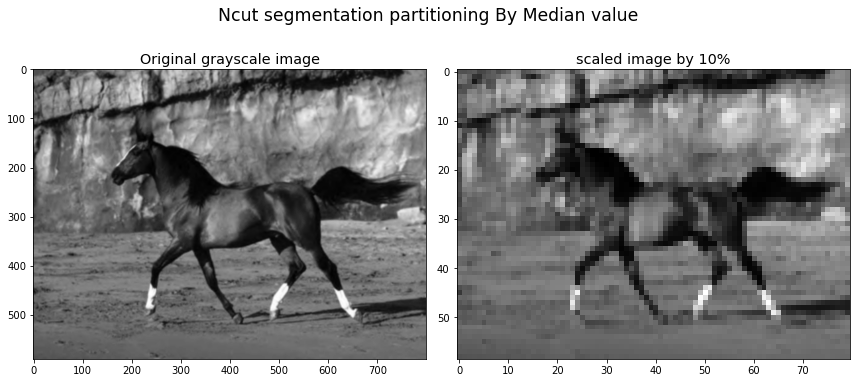

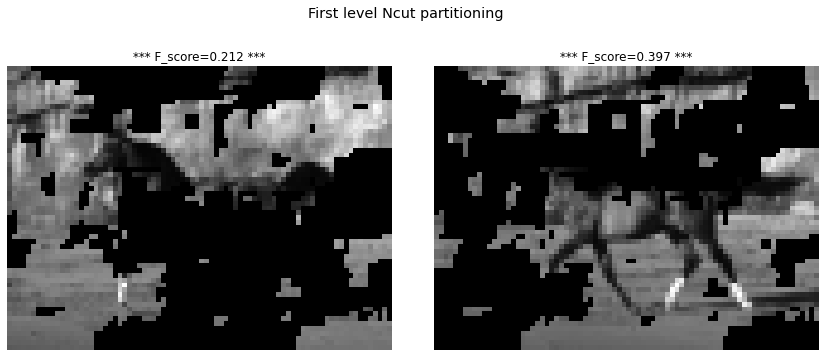

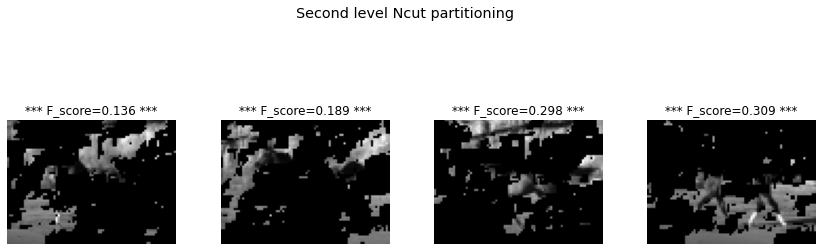

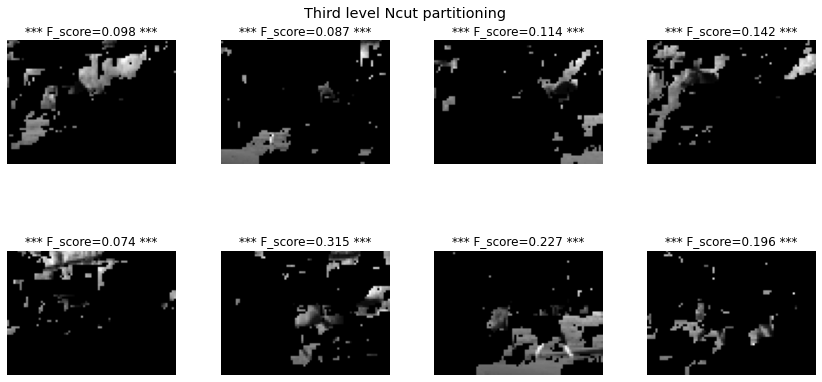

In [11]:
img_samp = cv2.imread(horses[0], cv2.IMREAD_GRAYSCALE)
img_samp = cv2.GaussianBlur(img_samp,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
gt = img_Resize(GT[0],(img_samp.shape[1],img_samp.shape[0]))
img_scl= resize(img_samp, get_scale_factor(img_samp))
depth = 3
ncut_list = []
for i in range(0, depth+1): #assign list of lists
    ncut_list.append([])
Ncut_Seg_recur(img_scl,0,depth,30,T = 0)
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle("Ncut segmentation partitioning By Median value", fontsize="xx-large")
axes[0].imshow(img_samp)
axes[0].set_title('Original grayscale image',fontsize="x-large")
axes[1].imshow(img_scl)
axes[1].set_title('scaled image by {0}%'.format(get_scale_factor(img_samp)),fontsize="x-large")
fig.tight_layout()
plt.show()
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle("First level Ncut partitioning", fontsize="x-large")
fig.tight_layout()
for i in range(2):
    axes[i].imshow(ncut_list[0][i])
    axes[i].axis('off')
    axes[i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[0][i],img_samp,gt)))
    
fig, axes = plt.subplots(1, 4, figsize=(12, 6))
fig.suptitle("Second level Ncut partitioning", fontsize="x-large",y=0.92)
fig.tight_layout()
for i in range(4):
    axes[i].imshow(ncut_list[1][i])
    axes[i].axis('off')
    axes[i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[1][i],img_samp,gt)))

fig, axes = plt.subplots(2, 4, figsize=(12, 6))   
fig.suptitle("Third level Ncut partitioning", fontsize="x-large")
fig.tight_layout()

for i in range(4):
    axes[0][i].imshow(ncut_list[2][i])
    axes[0][i].axis('off')
    axes[0][i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[2][i],img_samp,gt)))
    axes[1][i].imshow(ncut_list[2][i+4])
    axes[1][i].axis('off')
    axes[1][i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[2][i+4],img_samp,gt)))

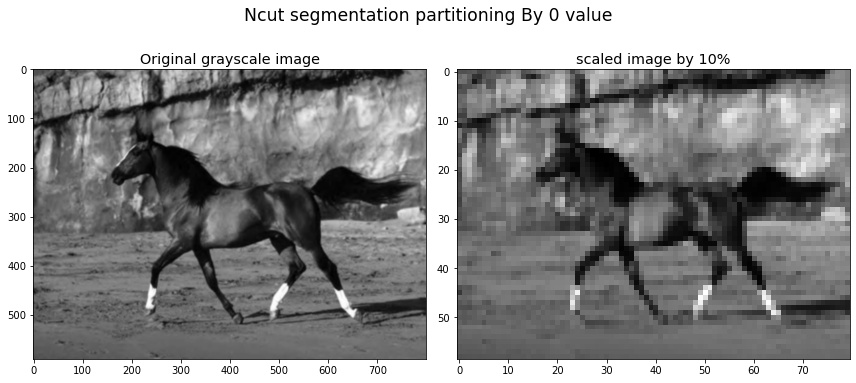

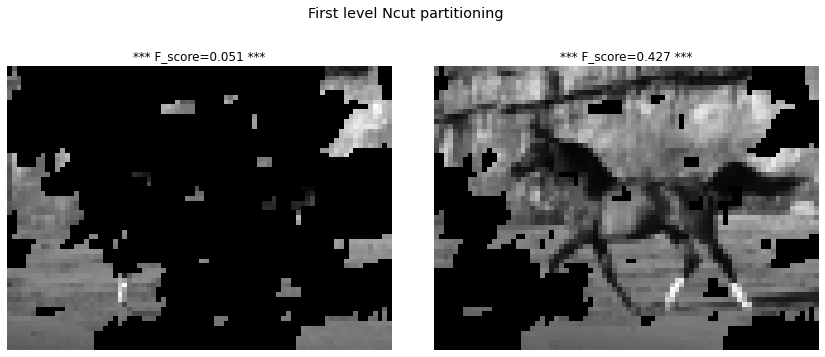

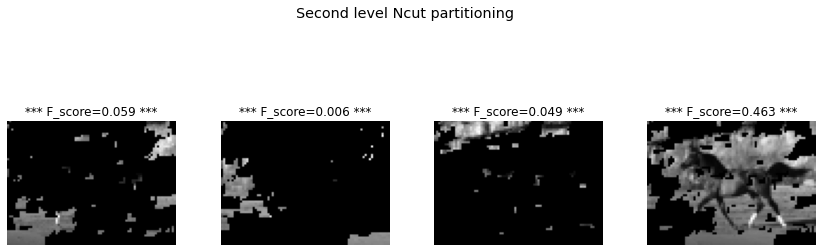

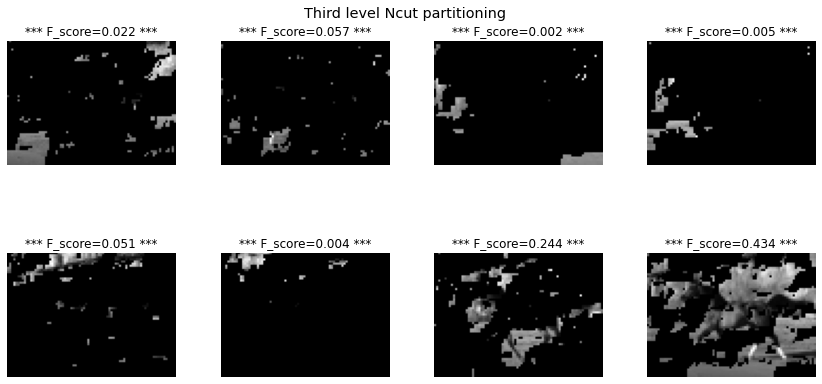

In [12]:
img_samp = cv2.imread(horses[0], cv2.IMREAD_GRAYSCALE)
img_samp = cv2.GaussianBlur(img_samp,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
gt = img_Resize(GT[0],(img_samp.shape[1],img_samp.shape[0]))
img_scl= resize(img_samp, get_scale_factor(img_samp))
depth = 3
ncut_list = []
for i in range(0, depth+1): #assign list of lists
    ncut_list.append([])
Ncut_Seg_recur(img_scl,0,depth,30,T = 1)
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle("Ncut segmentation partitioning By 0 value", fontsize="xx-large")
axes[0].imshow(img_samp)
axes[0].set_title('Original grayscale image',fontsize="x-large")
axes[1].imshow(img_scl)
axes[1].set_title('scaled image by {0}%'.format(get_scale_factor(img_samp)),fontsize="x-large")
fig.tight_layout()
plt.show()
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle("First level Ncut partitioning", fontsize="x-large")
fig.tight_layout()
for i in range(2):
    axes[i].imshow(ncut_list[0][i])
    axes[i].axis('off')
    axes[i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[0][i],img_samp,gt)))
    
fig, axes = plt.subplots(1, 4, figsize=(12, 6))
fig.suptitle("Second level Ncut partitioning", fontsize="x-large",y=0.92)
fig.tight_layout()
fig.subplots_adjust(bottom=0.06)
for i in range(4):
    axes[i].imshow(ncut_list[1][i])
    axes[i].axis('off')
    axes[i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[1][i],img_samp,gt)))

fig, axes = plt.subplots(2, 4, figsize=(12, 6))   
fig.suptitle("Third level Ncut partitioning", fontsize="x-large")
fig.tight_layout()
fig.subplots_adjust(bottom=0.06)
for i in range(4):
    axes[0][i].imshow(ncut_list[2][i])
    axes[0][i].axis('off')
    axes[0][i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[2][i],img_samp,gt)))
    axes[1][i].imshow(ncut_list[2][i+4])
    axes[1][i].axis('off')
    axes[1][i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[2][i+4],img_samp,gt)))

In [13]:
list_of_all = []
for num_of_im in tqdm(range(len(horses))): #Iterate over the image dataset
    img_samp = cv2.imread(horses[num_of_im], cv2.IMREAD_GRAYSCALE)
    img_samp = cv2.GaussianBlur(img_samp,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
    gt = img_Resize(GT[num_of_im],(img_samp.shape[1],img_samp.shape[0]))
    img_scl= resize(img_samp, get_scale_factor(img_samp))
    depth = 3
    ncut_list = []
    for i in range(0, depth+1): #assign global variable list of lists
        ncut_list.append([])
    Ncut_Seg_recur(img_scl,0,depth,30,T = 0)
    list_of_all.append(ncut_list)
np.save('NCUT_10_im_list',list_of_all)

In [14]:
list_of_all_nil = []
for num_of_im in tqdm(range(len(horses))): #Iterate over the image dataset
    img_samp = cv2.imread(horses[num_of_im], cv2.IMREAD_GRAYSCALE)
    img_samp = cv2.GaussianBlur(img_samp,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
    gt = img_Resize(GT[num_of_im],(img_samp.shape[1],img_samp.shape[0]))
    img_scl= resize(img_samp, get_scale_factor(img_samp))
    depth = 3
    ncut_list = []
    for i in range(0, depth+1): #assign global variable list of lists
        ncut_list.append([])
    Ncut_Seg_recur(img_scl,0,depth,30,T = 1)
    list_of_all_nil.append(ncut_list)
np.save('NCUT_10_im_list_nil',list_of_all_nil)

In [15]:
list_of_all = np.load('NCUT_10_im_list.npy',allow_pickle=True)
list_of_all_nil = np.load('NCUT_10_im_list_nil.npy',allow_pickle=True)
list_of_all_F = list_of_all.copy()
list_of_all_F_nil = list_of_all_nil.copy()

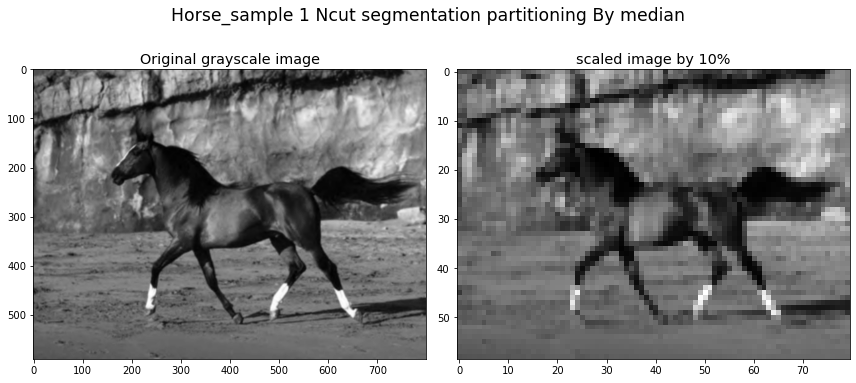

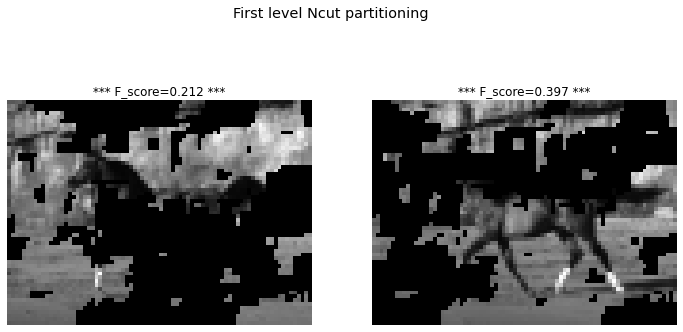

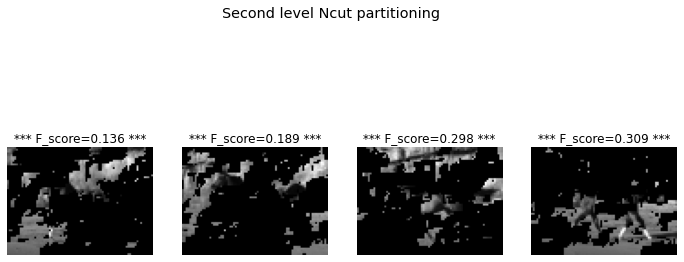

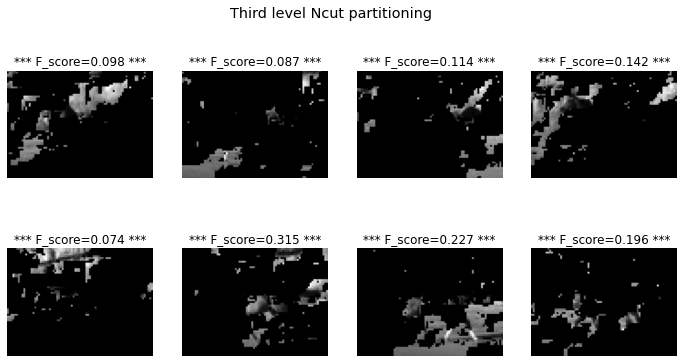

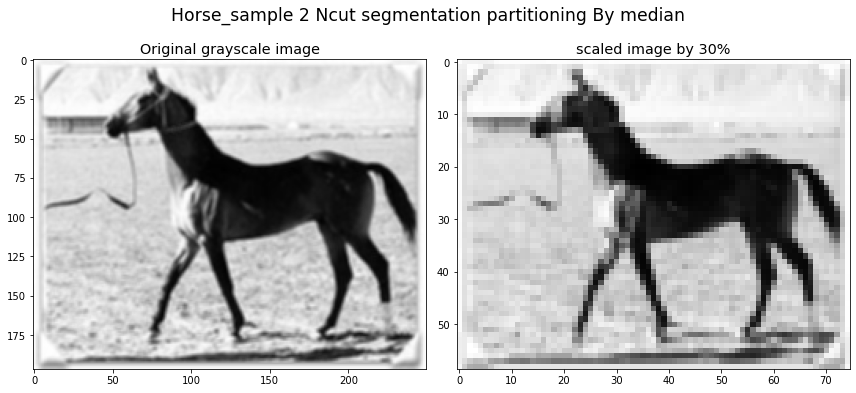

...

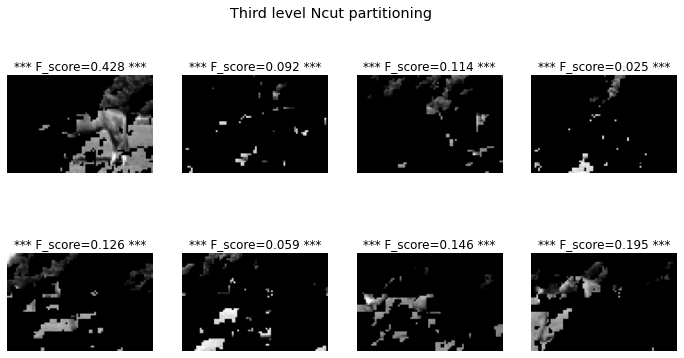

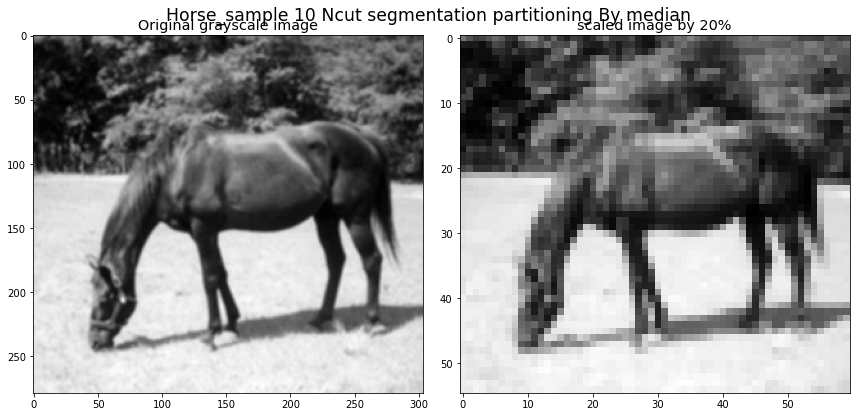

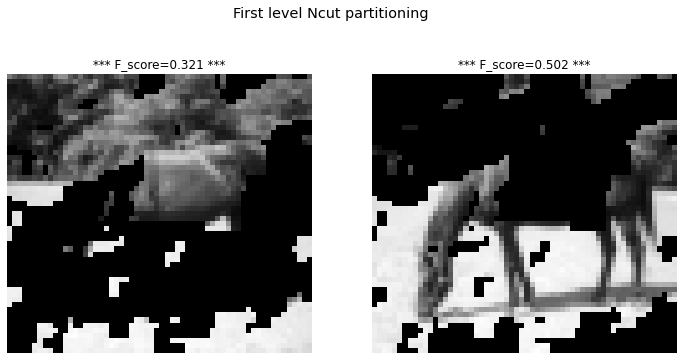

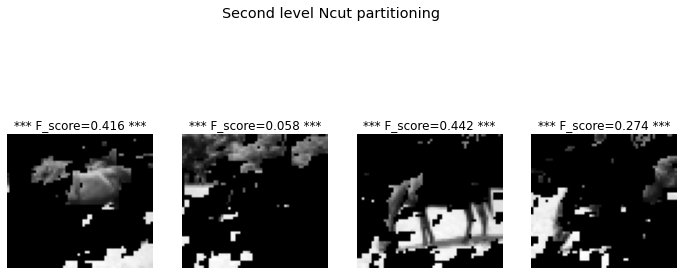

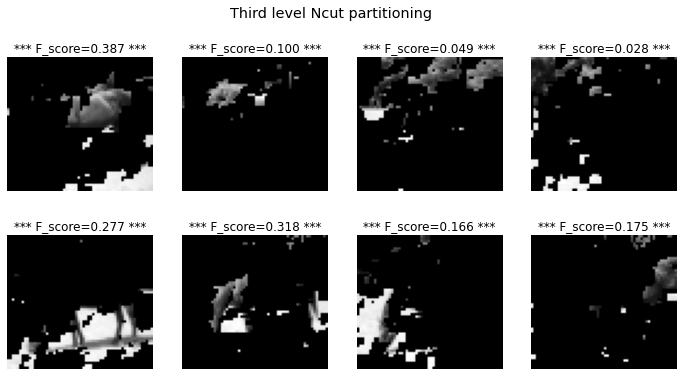

In [16]:
for count, ncut_list in enumerate(list_of_all):
    img_samp = cv2.imread(horses[count], cv2.IMREAD_GRAYSCALE)
    img_samp = cv2.GaussianBlur(img_samp,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
    gt = img_Resize(GT[count],(img_samp.shape[1],img_samp.shape[0]))
    img_scl= resize(img_samp, get_scale_factor(img_samp))
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle("Horse_sample {0} Ncut segmentation partitioning By median".format(count+1), fontsize="xx-large")
    axes[0].imshow(img_samp)
    axes[0].set_title('Original grayscale image',fontsize="x-large")
    axes[1].imshow(img_scl)
    axes[1].set_title('scaled image by {0}%'.format(get_scale_factor(img_samp)),fontsize="x-large")
    fig.tight_layout()
    plt.show()
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle("First level Ncut partitioning", fontsize="x-large")
#     fig.tight_layout()
    for i in range(2):
        axes[i].imshow(ncut_list[0][i])
        axes[i].axis('off')
        axes[i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[0][i],img_samp,gt)))
        list_of_all_F[count][0][i]= get_f_forNcut(ncut_list[0][i],img_samp,gt)

    plt.show() 
    fig, axes = plt.subplots(1, 4, figsize=(12, 6))
    fig.suptitle("Second level Ncut partitioning", fontsize="x-large",y=0.92)
#     fig.tight_layout()
#     fig.subplots_adjust(bottom=0.06)
    for i in range(4):
        axes[i].imshow(ncut_list[1][i])
        axes[i].axis('off')
        axes[i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[1][i],img_samp,gt)))
        list_of_all_F[count][1][i]= get_f_forNcut(ncut_list[1][i],img_samp,gt)
    fig.subplots_adjust(bottom=0.06)
    plt.show()
    
    fig, axes = plt.subplots(2, 4, figsize=(12, 6))   
    fig.suptitle("Third level Ncut partitioning", fontsize="x-large")
#     fig.tight_layout()

    for i in range(4):
        axes[0][i].imshow(ncut_list[2][i])
        axes[0][i].axis('off')
        axes[0][i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[2][i],img_samp,gt)))
        list_of_all_F[count][2][i]= get_f_forNcut(ncut_list[2][i],img_samp,gt)
        axes[1][i].imshow(ncut_list[2][i+4])
        axes[1][i].axis('off')
        axes[1][i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[2][i+4],img_samp,gt)))
        list_of_all_F[count][2][i+4]= get_f_forNcut(ncut_list[2][i+4],img_samp,gt)
    plt.show()
    print("\n\n")

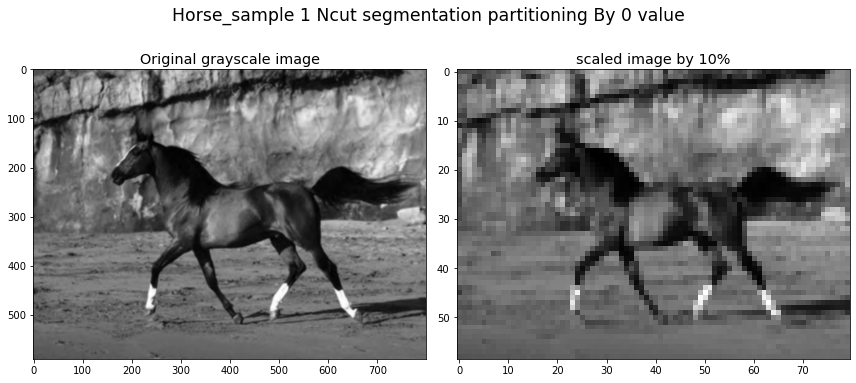

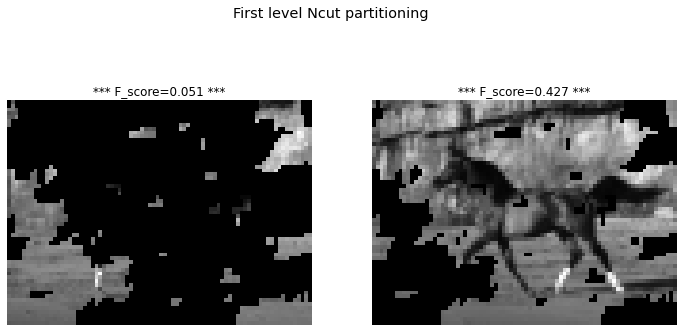

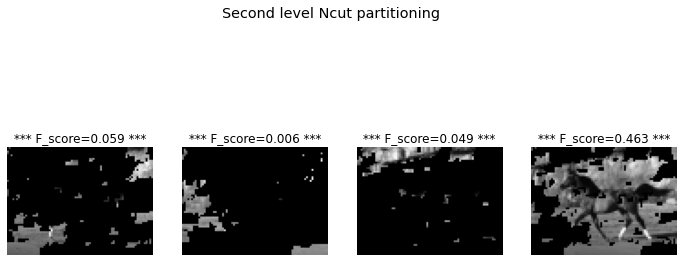

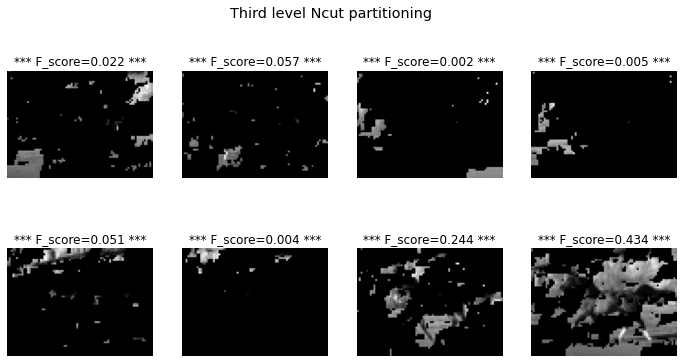

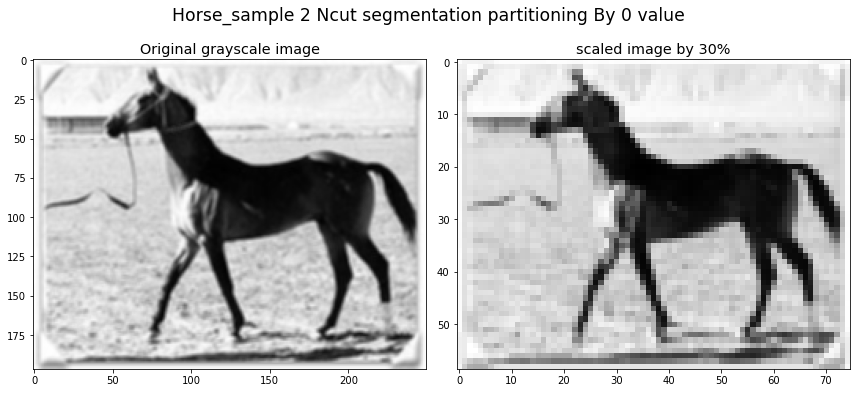

...

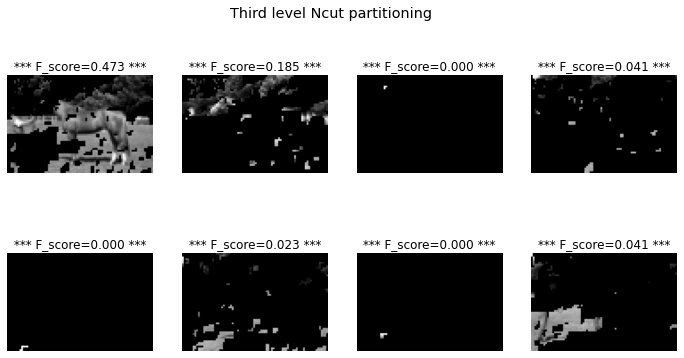

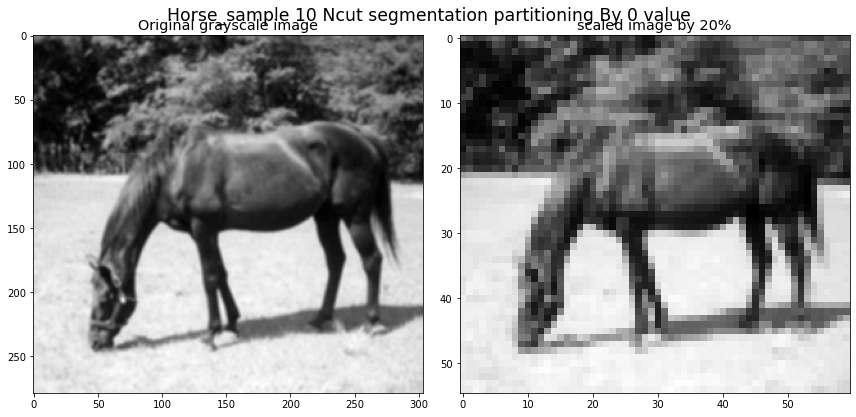

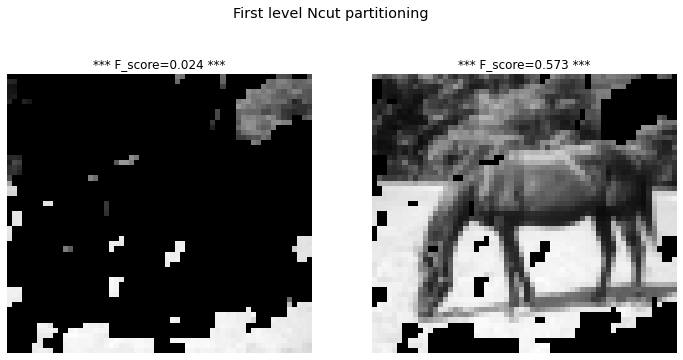

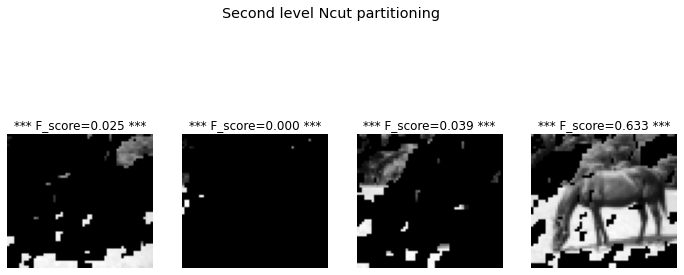

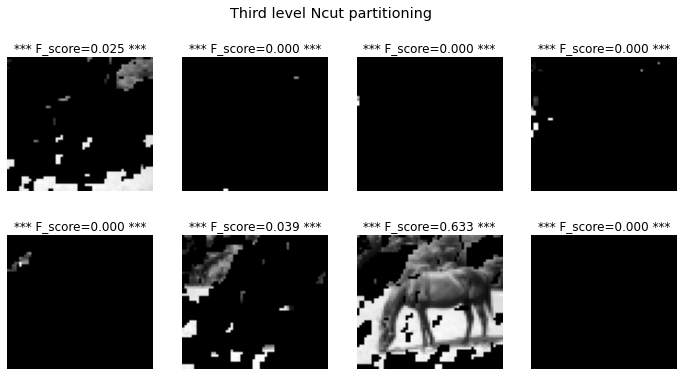

In [17]:
for count, ncut_list in enumerate(list_of_all_nil):
    img_samp = cv2.imread(horses[count], cv2.IMREAD_GRAYSCALE)
    img_samp = cv2.GaussianBlur(img_samp,(3,3),cv2.BORDER_DEFAULT) #remove some noise by smoothing
    gt = img_Resize(GT[count],(img_samp.shape[1],img_samp.shape[0]))
    img_scl= resize(img_samp, get_scale_factor(img_samp))
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle("Horse_sample {0} Ncut segmentation partitioning By 0 value".format(count+1), fontsize="xx-large")
    axes[0].imshow(img_samp)
    axes[0].set_title('Original grayscale image',fontsize="x-large")
    axes[1].imshow(img_scl)
    axes[1].set_title('scaled image by {0}%'.format(get_scale_factor(img_samp)),fontsize="x-large")
    fig.tight_layout()
    plt.show()
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle("First level Ncut partitioning", fontsize="x-large")
#     fig.tight_layout()
    for i in range(2):
        axes[i].imshow(ncut_list[0][i])
        axes[i].axis('off')
        axes[i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[0][i],img_samp,gt)))
        list_of_all_F_nil[count][0][i]= get_f_forNcut(ncut_list[0][i],img_samp,gt)

    plt.show() 
    fig, axes = plt.subplots(1, 4, figsize=(12, 6))
    fig.suptitle("Second level Ncut partitioning", fontsize="x-large",y=0.92)
#     fig.tight_layout()
#     fig.subplots_adjust(bottom=0.06)
    for i in range(4):
        axes[i].imshow(ncut_list[1][i])
        axes[i].axis('off')
        axes[i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[1][i],img_samp,gt)))
        list_of_all_F_nil[count][1][i]= get_f_forNcut(ncut_list[1][i],img_samp,gt)
    fig.subplots_adjust(bottom=0.06)
    plt.show()
    
    fig, axes = plt.subplots(2, 4, figsize=(12, 6))   
    fig.suptitle("Third level Ncut partitioning", fontsize="x-large")
#     fig.tight_layout()

    for i in range(4):
        axes[0][i].imshow(ncut_list[2][i])
        axes[0][i].axis('off')
        axes[0][i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[2][i],img_samp,gt)))
        list_of_all_F_nil[count][2][i]= get_f_forNcut(ncut_list[2][i],img_samp,gt)
        axes[1][i].imshow(ncut_list[2][i+4])
        axes[1][i].axis('off')
        axes[1][i].set_title("*** F_score={:0.3f} ***".format(get_f_forNcut(ncut_list[2][i+4],img_samp,gt)))
        list_of_all_F_nil[count][2][i+4]= get_f_forNcut(ncut_list[2][i+4],img_samp,gt)
    plt.show()
    print("\n\n")

In [18]:
#get maximal score of Ncut with median as Threshold
F_score_Ncut_samp_opt= np.zeros(10)
for i in range(10):
    F_score_Ncut_samp_opt[i] = max(list_of_all_F[i][0]+list_of_all_F[i][1]+list_of_all_F[i][2])
#get maximal score of Ncut with 0 as a Threshold
F_score_Ncut_samp_opt_nil= np.zeros(10)
for i in range(10):
    F_score_Ncut_samp_opt_nil[i] = max(list_of_all_F_nil[i][0]+list_of_all_F_nil[i][1]+list_of_all_F_nil[i][2])
# F_score_Ncut_samp_opt_nil,F_score_Ncut_samp_opt_nil.mean() 
np.save('F_score_Ncut_med', F_score_Ncut_samp_opt)
np.save('F_score_Ncut_nil', F_score_Ncut_samp_opt_nil)

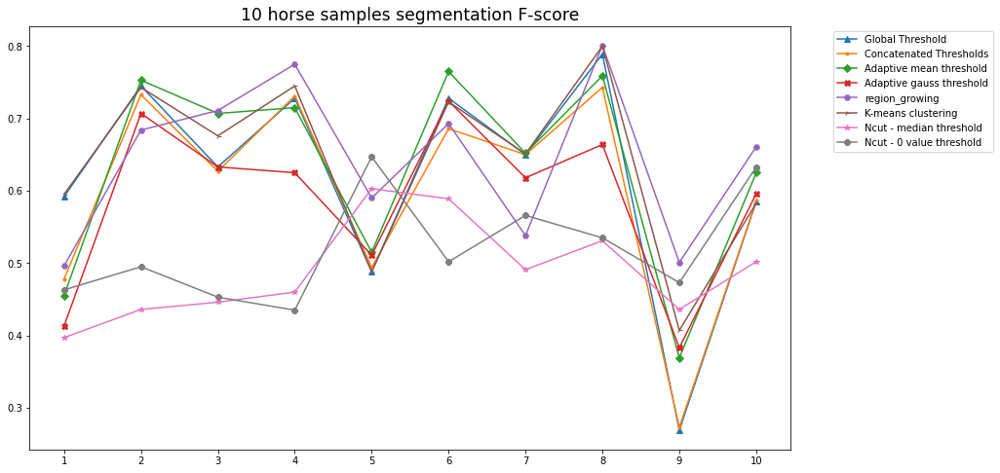

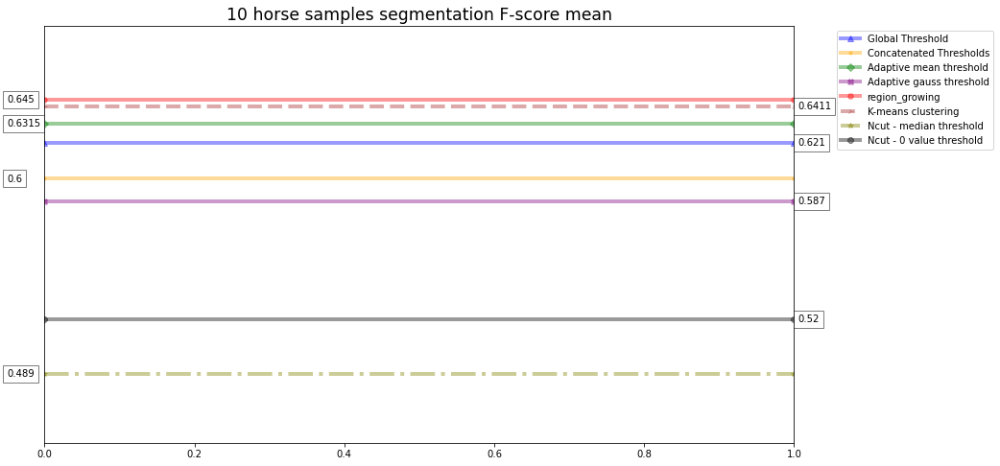

,Mean,Standard deviation,Num of Samples
region_growing,0.6450,0.103481,10.0
K-means clustering,0.6411,0.117556,10.0
Adaptive mean threshold,0.6315,0.132517,10.0
Global Threshold,0.6207,0.145331,10.0
Concatenated Thresholds,0.6001,0.141127,10.0
Adaptive gauss threshold,0.5874,0.110166,10.0
Ncut - 0 value threshold,0.5202,0.070256,10.0
Ncut - median threshold,0.4891,0.064579,10.0


In [23]:
a=np.load('global_th_f_vals.npy',allow_pickle=True)
b=np.load('concatenated_thresholds_f_vals.npy',allow_pickle=True)
c=np.load('adaptive_mean_f_vals.npy',allow_pickle=True)
d=np.load('adaptive_gauss_f_vals.npy',allow_pickle=True)
e=np.load('region_growing_f_vals.npy',allow_pickle=True)
f=np.load('k_means_f_vals.npy',allow_pickle=True)
g=np.load('F_score_Ncut_med.npy',allow_pickle=True)
h=np.load('F_score_Ncut_nil.npy',allow_pickle=True)

t = np.arange(1,11)
plt.figure(figsize=(14, 8))
plt.title('10 horse samples segmentation F-score',fontsize="xx-large")
plt.xticks(t)
plt.plot(t,a,marker="^",ls='-',label='Global Threshold')
plt.plot(t,b,marker=".",ls='-',label='Concatenated Thresholds')
plt.plot(t,c,marker="D",ls='-',label='Adaptive mean threshold')
plt.plot(t,d,marker="X",ls= '-',label='Adaptive gauss threshold')
plt.plot(t,e,marker="H",ls='-',label='region_growing')
plt.plot(t,f,marker="4",ls='-',label='K-means clustering')
plt.plot(t,g,marker="*",ls='-',label='Ncut - median threshold')
plt.plot(t,h,marker="8",ls='-',label='Ncut - 0 value threshold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
import matplotlib.transforms as transforms
fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111)
ax.set_ylim(bottom = 0.45, top = 0.687)
ax.get_yaxis().set_visible(False)
# ax.set_ylim(bottom=0)
ax.set_title('10 horse samples segmentation F-score mean',fontsize="xx-large")
ax.axhline(a.mean(),color = 'blue',marker="^",ls='-',label='Global Threshold',linewidth=4, alpha=0.4)
ax.text(1.005, a.mean(), np.round(a.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(b.mean(),color = 'orange',marker=".",ls='-',label='Concatenated Thresholds',linewidth=4, alpha=0.4)
ax.text(-0.05, b.mean(), np.round(b.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(c.mean(),color = 'green',marker="D",ls='-',label='Adaptive mean threshold',linewidth=4, alpha=0.4)
ax.text(-0.05, c.mean(), c.mean(), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(d.mean(),color = 'purple',marker="X",ls= '-',label='Adaptive gauss threshold',linewidth=4, alpha=0.4)
ax.text(1.005, d.mean(), np.round(d.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(e.mean(),color = 'red',marker="H",ls='-',label='region_growing',linewidth=4, alpha=0.4)
ax.text(-0.05, e.mean(), np.round(e.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(f.mean(),color = 'brown',marker="4",ls='--',label='K-means clustering',linewidth=4, alpha=0.4)
ax.text(1.005, f.mean(), f.mean(), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(g.mean(),color = 'olive',marker="*",ls='-.',label='Ncut - median threshold',linewidth=4, alpha=0.4)
ax.text(-0.05, g.mean(), np.round(g.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(h.mean(),color = 'black',marker="8",ls='-',label='Ncut - 0 value threshold',linewidth=4, alpha=0.4)
ax.text(1.005, h.mean(), np.round(h.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
names = ['Global Threshold','Concatenated Thresholds','Adaptive mean threshold','Adaptive gauss threshold','region_growing','K-means clustering','Ncut - median threshold','Ncut - 0 value threshold']
means = [a.mean(),b.mean(),c.mean(),d.mean(),e.mean(),f.mean(),g.mean(),h.mean()]
stds = [a.std(),b.std(),c.std(),d.std(),e.std(),f.std(),g.std(),h.std()]
data = np.array([np.array(means), np.array(stds),(np.ones(8)*len(horses))]) 
pd.DataFrame(data.T, index = names,columns = ['Mean', 'Standard deviation',"Num of Samples"]).sort_values(by = ["Mean"], ascending=False)

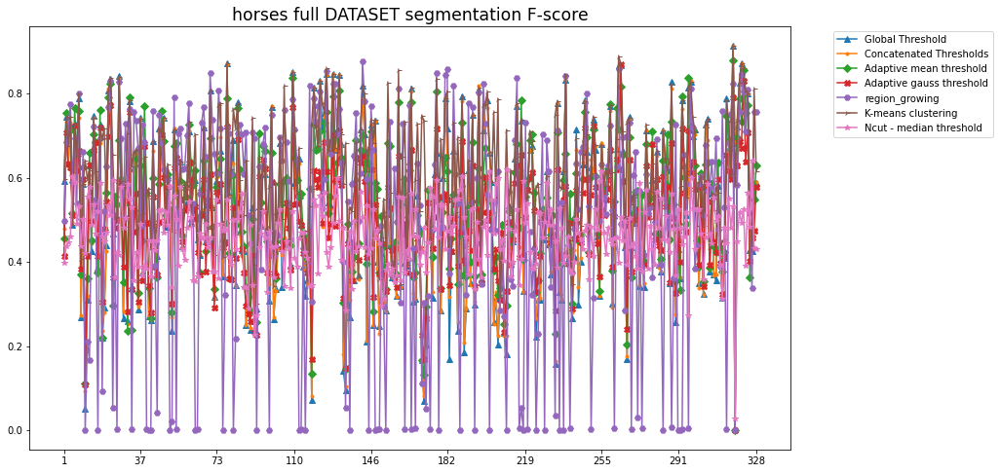

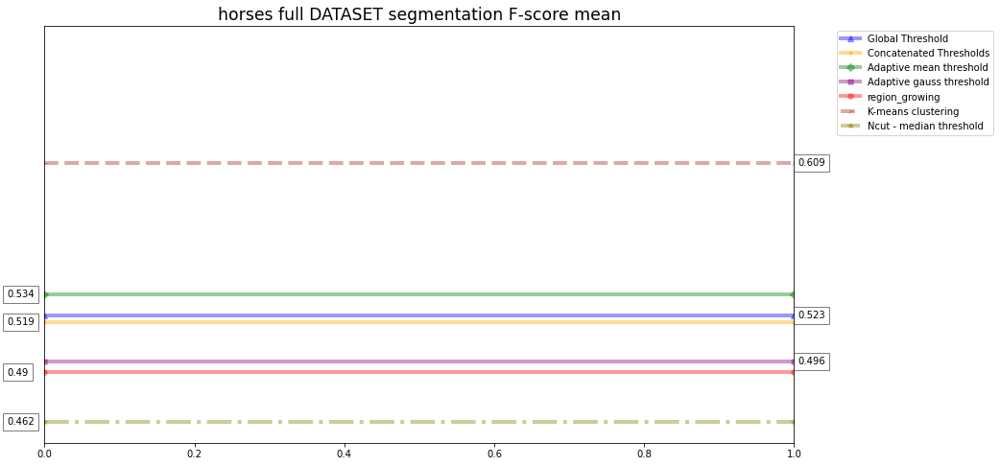

,Mean,Standard deviation,Num of Samples
K-means clustering,0.608976,0.138169,328.0
Adaptive mean threshold,0.534341,0.155022,328.0
Global Threshold,0.522631,0.188861,328.0
Concatenated Thresholds,0.518549,0.179670,328.0
Adaptive gauss threshold,0.496320,0.129592,328.0
region_growing,0.490006,0.271828,328.0
Ncut - median threshold,0.461875,0.077771,328.0


In [24]:
a=np.load('global_th_f_vals_328.npy',allow_pickle=True)
b=np.load('concatenated_thresholds_f_vals_328.npy',allow_pickle=True)
c=np.load('adaptive_mean_f_vals_328.npy',allow_pickle=True)
d=np.load('adaptive_gauss_f_vals_328.npy',allow_pickle=True)
e=np.load('region_growing_f_vals_328.npy',allow_pickle=True)
f=np.load('k_means_f_vals_328.npy',allow_pickle=True)
g=np.load('F_score_Ncut_med_328.npy',allow_pickle=True)
# h=np.load('F_score_Ncut_nil.npy',allow_pickle=True)

t = np.arange(1,329)
plt.figure(figsize=(14, 8))
plt.title('horses full DATASET segmentation F-score',fontsize="xx-large")
plt.xticks(np.floor(np.linspace(1,328,10)))
plt.plot(t,a,marker="^",ls='-',label='Global Threshold')
plt.plot(t,b,marker=".",ls='-',label='Concatenated Thresholds')
plt.plot(t,c,marker="D",ls='-',label='Adaptive mean threshold')
plt.plot(t,d,marker="X",ls= '-',label='Adaptive gauss threshold')
plt.plot(t,e,marker="H",ls='-',label='region_growing')
plt.plot(t,f,marker="4",ls='-',label='K-means clustering')
plt.plot(t,g,marker="*",ls='-',label='Ncut - median threshold')
# plt.plot(t,h,marker="8",ls='-',label='Ncut - 0 value threshold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
import matplotlib.transforms as transforms
fig = plt.figure(figsize=(14, 8))
ax = fig.add_subplot(111)
ax.set_ylim(bottom = 0.45, top = 0.687)
ax.get_yaxis().set_visible(False)
# ax.set_ylim(bottom=0)
ax.set_title('horses full DATASET segmentation F-score mean',fontsize="xx-large")
ax.axhline(a.mean(),color = 'blue',marker="^",ls='-',label='Global Threshold',linewidth=4, alpha=0.4)
ax.text(1.005, a.mean(), np.round(a.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(b.mean(),color = 'orange',marker=".",ls='-',label='Concatenated Thresholds',linewidth=4, alpha=0.4)
ax.text(-0.05, b.mean(), np.round(b.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(c.mean(),color = 'green',marker="D",ls='-',label='Adaptive mean threshold',linewidth=4, alpha=0.4)
ax.text(-0.05, c.mean(), np.round(c.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(d.mean(),color = 'purple',marker="X",ls= '-',label='Adaptive gauss threshold',linewidth=4, alpha=0.4)
ax.text(1.005, d.mean(), np.round(d.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(e.mean(),color = 'red',marker="H",ls='-',label='region_growing',linewidth=4, alpha=0.4)
ax.text(-0.05, e.mean(), np.round(e.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(f.mean(),color = 'brown',marker="4",ls='--',label='K-means clustering',linewidth=4, alpha=0.4)
ax.text(1.005, f.mean(), np.round(f.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
ax.axhline(g.mean(),color = 'olive',marker="*",ls='-.',label='Ncut - median threshold',linewidth=4, alpha=0.4)
ax.text(-0.05, g.mean(), np.round(g.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
# ax.axhline(h.mean(),color = 'black',marker="8",ls='-',label='Ncut - 0 value threshold',linewidth=4, alpha=0.4)
# ax.text(1.005, h.mean(), np.round(h.mean(),3), va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5),transform=ax.get_yaxis_transform())
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
names = ['Global Threshold','Concatenated Thresholds','Adaptive mean threshold','Adaptive gauss threshold','region_growing','K-means clustering','Ncut - median threshold']#,'Ncut - 0 value threshold']
means = [a.mean(),b.mean(),c.mean(),d.mean(),e.mean(),f.mean(),g.mean()]#,h.mean()]
stds = [a.std(),b.std(),c.std(),d.std(),e.std(),f.std(),g.std()]#,h.std()]
data = np.array([np.array(means), np.array(stds),(np.ones(7)*328)]) 
pd.DataFrame(data.T, index = names,columns = ['Mean', 'Standard deviation',"Num of Samples"]).sort_values(by = ["Mean"], ascending=False)